In [1]:
!pip install tweepy

In [2]:
!pip install textblob

In [3]:
!pip install wordcloud

# Importing Libraries

In [201]:
import pandas as pd
import numpy as np
import tweepy as tw
import os
import re
from tweepy import OAuthHandler
from textblob import TextBlob
from bs4 import BeautifulSoup
import requests
import lxml
import seaborn as sns
import matplotlib.pyplot as plt                         
plt.style.use('fivethirtyeight')
from wordcloud import WordCloud
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from nltk.corpus import stopwords

# Extracting data from Twitter

In [3]:
# your Twitter API key and API secret
my_api_key = ''
my_api_secret = ''
# authenticate
auth = tw.OAuthHandler(my_api_key, my_api_secret)
api = tw.API(auth, wait_on_rate_limit=True)

# Selecting keywords for each of the Eastern Conference NBA teams for text data extraction from Twitter

In [4]:
search_query_Bucks1 = "#MilwaukeeBucks -filter:retweets"
search_query_Bucks2 = "#Milwaukee Bucks -filter:retweets"
search_query_Bucks3 = "#milwaukeebucks -filter:retweets"
search_query_Bucks4 = "#milwaukee bucks -filter:retweets"
search_query_Bucks5 = "#Giannis -filter:retweets"
search_query_Bucks6 = "#giannis -filter:retweets"
search_query_Bucks7 = "#GiannisAntetokounmpo -filter:retweets"
search_query_Bucks8 = "#Giannis Antetokounmpo -filter:retweets"
search_query_Bucks9 = "#giannis antetokounmpo Leonard -filter:retweets"
search_query_Bucks10 = "#giannisantetokounmpo -filter:retweets"
search_query_Bucks11 = "#Giannis_An34 -filter:retweets"
search_query_Bucks12 = "#Khris22m -filter:retweets"
search_query_Bucks13 = "#KhrisMiddleton -filter:retweets"
search_query_Bucks14 = "#Khris Middleton -filter:retweets"
search_query_Bucks15 = "#khrismiddleton -filter:retweets"
search_query_Bucks16 = "#khris middleton -filter:retweets"
search_query_Bucks17 = "#Jrue_Holiday11 -filter:retweets"
search_query_Bucks18 = "#JrueHoliday -filter:retweets"
search_query_Bucks19 = "#Jrue Holiday -filter:retweets"
search_query_Bucks20 = "#jrueholiday -filter:retweets"
search_query_Bucks21 = "#jrue holiday -filter:retweets"
search_query_Bucks22 = "#BucksBasketball -filter:retweets"
search_query_Bucks23 = "#bucksbasketball -filter:retweets"
search_query_Bucks24 = "#Bucks Basketball -filter:retweets"
search_query_Bucks25 = "#bucks basketball -filter:retweets"

In [5]:
search_query_Celtics1 = "#Celtics -filter:retweets"
search_query_Celtics2 = "#celtics -filter:retweets"
search_query_Celtics3 = "#BostonCeltics -filter:retweets"
search_query_Celtics4 = "#Boston Celtics -filter:retweets"
search_query_Celtics5 = "#bostonceltics -filter:retweets"
search_query_Celtics6 = "#boston celtics -filter:retweets"
search_query_Celtics7 = "#jaytatum0 -filter:retweets"
search_query_Celtics8 = "#JaysonTatum -filter:retweets"
search_query_Celtics9 = "#Jayson Tatum -filter:retweets"
search_query_Celtics10 = "jaysontatum -filter:retweets"
search_query_Celtics11 = "#jayson tatum -filter:retweets"
search_query_Celtics12 = "#FCHWPO -filter:retweets"
search_query_Celtics13 = "#JaylenBrown -filter:retweets"
search_query_Celtics14 = "#Jaylen Brown -filter:retweets"
search_query_Celtics15 = "#jaylenbrown -filter:retweets"
search_query_Celtics16 = "#jaylen brown -filter:retweets"
search_query_Celtics17 = "#smart_MS3 -filter:retweets"
search_query_Celtics18 = "#MarcusSmart -filter:retweets"
search_query_Celtics19 = "#Marcus Smart -filter:retweets"
search_query_Celtics20 = "#marcus smart -filter:retweets"
search_query_Celtics21 = "#marcussmart -filter:retweets"
search_query_Celtics22 = "#Al_Horford -filter:retweets"
search_query_Celtics23 = "#AlHorford -filter:retweets"
search_query_Celtics24 = "#Al Horford -filter:retweets"
search_query_Celtics25 = "#alhorford -filter:retweets"
search_query_Celtics26 = "#al horford -filter:retweets"

In [6]:
search_query_Hornets1 = "#CharlotteHornets -filter:retweets"
search_query_Hornets2 = "#Charlotte Hornets -filter:retweets"
search_query_Hornets3 = "#charlottehornets -filter:retweets"
search_query_Hornets4 = "#charlotte hornets -filter:retweets"
search_query_Hornets5 = "#MELOD1P -filter:retweets"
search_query_Hornets6 = "#LaMeloBall -filter:retweets"
search_query_Hornets7 = "#LaMelo Ball -filter:retweets"
search_query_Hornets8 = "#lameloball -filter:retweets"
search_query_Hornets9 = "#lamelo ball -filter:retweets"
search_query_Hornets10 = "#LiAngeloBall -filter:retweets"
search_query_Hornets11 = "#LiAngelo Ball -filter:retweets"
search_query_Hornets12 = "#liangeloball -filter:retweets"
search_query_Hornets13 = "#liangelo ball -filter:retweets"
search_query_Hornets14 = "#GordonHayward -filter:retweets"
search_query_Hornets15 = "#Gordon Hayward -filter:retweets"
search_query_Hornets16 = "#gordonhayward -filter:retweets"
search_query_Hornets17 = "#gordon hayward -filter:retweets"

In [7]:
search_query_Heat1 = "#MiamiHeat -filter:retweets"
search_query_Heat2 = "#Miami Heat -filter:retweets"
search_query_Heat3 = "#miamiheat -filter:retweets"
search_query_Heat4 = "#miami heat -filter:retweets"
search_query_Heat5 = "#JimmyButler -filter:retweets"
search_query_Heat6 = "#Jimmy Butler -filter:retweets"
search_query_Heat7 = "#jimmybutler -filter:retweets"
search_query_Heat8 = "#jimmy butler -filter:retweets"
search_query_Heat9 = "#raf_tyler -filter:retweets"
search_query_Heat10 = "#TylerHerro -filter:retweets"
search_query_Heat11 = "#Tyler Herro -filter:retweets"
search_query_Heat12 = "#tylerherro -filter:retweets"
search_query_Heat13 = "#tyler herro -filter:retweets"
search_query_Heat14 = "#VicOladipo -filter:retweets"
search_query_Heat15 = "#VictorOladipo -filter:retweets"
search_query_Heat16 = "#Victor Oladipo -filter:retweets"
search_query_Heat17 = "#victoroladipo -filter:retweets"
search_query_Heat18 = "#victor oladipo -filter:retweets"
search_query_Heat19 = "#Bam1of1 -filter:retweets"
search_query_Heat20 = "#BamAdebayo -filter:retweets"
search_query_Heat21 = "#Bam Adebayo -filter:retweets"
search_query_Heat22 = "#bamadebayo -filter:retweets"
search_query_Heat23 = "#bam adebayo -filter:retweets"
search_query_Heat24 = "#CoachSpo -filter:retweets"
search_query_Heat25 = "#ErikSpoelstra -filter:retweets"
search_query_Heat26 = "#Erik Spoelstra -filter:retweets"
search_query_Heat27 = "#erikspoelstra -filter:retweets"
search_query_Heat28 = "#erik spoelstra -filter:retweets"

In [8]:
search_query_Hawks1 = "#AtlantaHawks -filter:retweets"
search_query_Hawks2 = "#Atlanta Hawks -filter:retweets"
search_query_Hawks3 = "#atlantahawks -filter:retweets"
search_query_Hawks4 = "#atlanta hawks -filter:retweets"
search_query_Hawks5 = "#TheTraeYoung -filter:retweets"
search_query_Hawks6 = "#TraeYoung -filter:retweets"
search_query_Hawks7 = "#Trae Young -filter:retweets"
search_query_Hawks8 = "#trae young -filter:retweets"
search_query_Hawks9 = "#traeyoung -filter:retweets"
search_query_Hawks10 = "#CapelaClint -filter:retweets"
search_query_Hawks11 = "#ClintCapela -filter:retweets"
search_query_Hawks12 = "#Clint Capela -filter:retweets"
search_query_Hawks13 = "#clintcapela -filter:retweets"
search_query_Hawks14 = "#clint capela -filter:retweets"

In [9]:
search_query_Nets1 = "#BrooklynNets -filter:retweets"
search_query_Nets2 = "#Brooklyn Nets -filter:retweets"
search_query_Nets3 = "#brooklynnets -filter:retweets"
search_query_Nets4 = "#brooklyn nets -filter:retweets"
search_query_Nets5 = "#KDTrey5 -filter:retweets"
search_query_Nets6 = "#KevinDurant -filter:retweets"
search_query_Nets7 = "#Kevin Durant -filter:retweets"
search_query_Nets8 = "#kevindurant -filter:retweets"
search_query_Nets9 = "#kevin durant -filter:retweets"
search_query_Nets10 = "#Durant -filter:retweets"
search_query_Nets11 = "#durant -filter:retweets"
search_query_Nets12 = "#KyrieIrving -filter:retweets"
search_query_Nets13 = "#Kyrie Irving -filter:retweets"
search_query_Nets14 = "#kyrieirving -filter:retweets"
search_query_Nets15 = "#kyrie irving -filter:retweets"
search_query_Nets16 = "#BenSimmons25 -filter:retweets"
search_query_Nets17 = "#BenSimmons -filter:retweets"
search_query_Nets18 = "#Ben Simmons -filter:retweets"
search_query_Nets19 = "#bensimmons -filter:retweets"
search_query_Nets20 = "#ben simmons -filter:retweets"
search_query_Nets21 = "#BrooklynNets -filter:retweets"

In [10]:
search_query_Bulls1 = "#ChicagoBulls -filter:retweets"
search_query_Bulls2 = "#Chicago Bulls -filter:retweets"
search_query_Bulls3 = "#chicagobulls -filter:retweets"
search_query_Bulls4 = "#chicago bulls -filter:retweets"
search_query_Bulls5 = "#ZO2_ -filter:retweets"
search_query_Bulls6 = "#LonzoBall -filter:retweets"
search_query_Bulls7 = "#Lonzo Ball -filter:retweets"
search_query_Bulls8 = "#lonzoball -filter:retweets"
search_query_Bulls9 = "#lonzo ball -filter:retweets"
search_query_Bulls10 = "#ZachLaVine -filter:retweets"
search_query_Bulls11 = "#Zach LaVine -filter:retweets"
search_query_Bulls12 = "#zachlavine -filter:retweets"
search_query_Bulls13 = "#zach lavine -filter:retweets"
search_query_Bulls14 = "#DeMar_DeRozan -filter:retweets"
search_query_Bulls15 = "#DeMarDeRozan -filter:retweets"
search_query_Bulls16 = "#DeMar DeRozan -filter:retweets"
search_query_Bulls17 = "#demarderozan -filter:retweets"
search_query_Bulls18 = "#demar derozan -filter:retweets"
search_query_Bulls19 = "#DeRozan -filter:retweets"
search_query_Bulls20 = "#derozan -filter:retweets"

In [11]:
search_query_Raptors1 = "#TorontoRaptors -filter:retweets"
search_query_Raptors2 = "#Toronto Raptors -filter:retweets"
search_query_Raptors3 = "#torontoraptors -filter:retweets"
search_query_Raptors4 = "#toronto raptors -filter:retweets"
search_query_Raptors5 = "#ScottBarnes561 -filter:retweets"
search_query_Raptors6 = "#ScottieBarnes -filter:retweets"
search_query_Raptors7 = "#ScottBarnes -filter:retweets"
search_query_Raptors8 = "#Scottie Barnes -filter:retweets"
search_query_Raptors9 = "#Scott Barnes -filter:retweets"
search_query_Raptors10 = "#scottbarnes -filter:retweets"
search_query_Raptors11 = "#scottiebarnes -filter:retweets"
search_query_Raptors12 = "#scott barnes -filter:retweets"
search_query_Raptors13 = "#scottie barnes -filter:retweets"
search_query_Raptors14 = "#pskills43 -filter:retweets"
search_query_Raptors15 = "#PascalSiakam -filter:retweets"
search_query_Raptors16 = "#Pascal Siakam -filter:retweets"
search_query_Raptors17 = "#pascalsiakam -filter:retweets"
search_query_Raptors18 = "#pascal siakam -filter:retweets"
search_query_Raptors19 = "#Siakam -filter:retweets"
search_query_Raptors20 = "#siakam -filter:retweets"
search_query_Raptors21 = "#OttoPorter -filter:retweets"

In [12]:
search_query_Magic1 = "#OrlandoMagic -filter:retweets"
search_query_Magic2 = "#Orlando Magic -filter:retweets"
search_query_Magic3 = "#orlandomagic -filter:retweets"
search_query_Magic4 = "#orlando magic -filter:retweets"

In [13]:
search_query_76ers1 = "#Philadelphia76ers -filter:retweets"
search_query_76ers2 = "#Philadelphia 76ers -filter:retweets"
search_query_76ers3 = "76ers -filter:retweets"
search_query_76ers4 = "#philadelphia76ers -filter:retweets"
search_query_76ers5 = "#philadelphia 76ers -filter:retweets"
search_query_76ers6 = "#JHarden13 -filter:retweets"
search_query_76ers7 = "#JamesHarden -filter:retweets"
search_query_76ers8 = "#James Harden -filter:retweets"
search_query_76ers9 = "#jamesharden  -filter:retweets"
search_query_76ers10 = "#james harden -filter:retweets"
search_query_76ers11 = "#JoelEmbiid -filter:retweets"
search_query_76ers12 = "#Joel Embiid -filter:retweets"
search_query_76ers13 = "#joelembiid -filter:retweets"
search_query_76ers14 = "#joel embiid -filter:retweets"
search_query_76ers15 = "#Embiid -filter:retweets"
search_query_76ers16 = "#embiid -filter:retweets"

In [14]:
search_query_Knicks1 = "#NewYorkKnicks -filter:retweets"
search_query_Knicks2 = "#New York Knicks -filter:retweets"
search_query_Knicks3 = "#Knicks -filter:retweets"
search_query_Knicks4 = "#knicks -filter:retweets"
search_query_Knicks5 = "#newyorkknicks -filter:retweets"
search_query_Knicks6 = "#new york knicks -filter:retweets"
search_query_Knicks7 = "#drose -filter:retweets"
search_query_Knicks8 = "#DerrickRose -filter:retweets"
search_query_Knicks9 = "#derrickrose -filter:retweets"
search_query_Knicks10 = "#Derrick Rose -filter:retweets"
search_query_Knicks11 = "#derrick rose -filter:retweets"
search_query_Knicks12 = "#J30_RANDLE -filter:retweets"
search_query_Knicks13 = "#JuliusRandle -filter:retweets"
search_query_Knicks14 = "#Julius Randle -filter:retweets"
search_query_Knicks15 = "#juliusrandle -filter:retweets"
search_query_Knicks16 = "#julius randle -filter:retweets"
search_query_Knicks17 = "#EvanFourmizz -filter:retweets"
search_query_Knicks18 = "#EvanFournier -filter:retweets"
search_query_Knicks19 = "#Evan Fournier -filter:retweets"
search_query_Knicks20 = "#evanfournier -filter:retweets"
search_query_Knicks21 = "#evan fournier -filter:retweets"

In [15]:
search_query_Cavs1 = "#ClevelandCavaliers -filter:retweets"
search_query_Cavs2 = "#Cleveland Cavaliers -filter:retweets"
search_query_Cavs3 = "#clevelandcavaliers -filter:retweets"
search_query_Cavs4 = "#cleveland cavaliers -filter:retweets"
search_query_Cavs5 = "#Cavs -filter:retweets"
search_query_Cavs6 = "#cavs -filter:retweets"
search_query_Cavs7 = "#kevinlove -filter:retweets"
search_query_Cavs8 = "#KevinLove -filter:retweets"
search_query_Cavs9 = "#Kevin Love -filter:retweets"
search_query_Cavs10 = "#kevin love -filter:retweets"
search_query_Cavs11 = "#dariusgarland22 -filter:retweets"
search_query_Cavs12 = "#DariusGarland -filter:retweets"
search_query_Cavs13 = "#Darius Garland -filter:retweets"
search_query_Cavs14 = "#dariusgarland -filter:retweets"
search_query_Cavs15 = "#darius garland -filter:retweets"

In [16]:
search_query_Pistons1 = "#DetroitPistons -filter:retweets"
search_query_Pistons2 = "#Detroit Pistons -filter:retweets"
search_query_Pistons3 = "#detroitpistons -filter:retweets"
search_query_Pistons4 = "detroit pistons -filter:retweets"
search_query_Pistons5 = "#Detroit_Pistons -filter:retweets"
search_query_Pistons6 = "#detroit_pistons -filter:retweets"

In [17]:
search_query_Wizards1 = "#WashingtonWizards -filter:retweets"
search_query_Wizards2 = "#Washington Wizards -filter:retweets"
search_query_Wizards3 = "#washingtonwizards -filter:retweets"
search_query_Wizards4 = "#washington wizards -filter:retweets"
search_query_Wizards5 = "#RealDealBeal23 -filter:retweets"
search_query_Wizards6 = "#BradleyBeal -filter:retweets"
search_query_Wizards7 = "#Bradley Beal -filter:retweets"
search_query_Wizards8 = "#bradleybeal -filter:retweets"
search_query_Wizards9 = "#bradley beal -filter:retweets"
search_query_Wizards10 = "#kylekuzma -filter:retweets"
search_query_Wizards11 = "#KyleKuzma -filter:retweets"
search_query_Wizards12 = "#Kyle Kuzma Wizards -filter:retweets"
search_query_Wizards13 = "#kyle kuzma Wizards -filter:retweets"

In [18]:
search_query_Pacers1 = "#IndianaPacers -filter:retweets"
search_query_Pacers2 = "#Indiana Pacers -filter:retweets"
search_query_Pacers3 = "#indianapacers -filter:retweets"
search_query_Pacers4 = "#indiana pacers -filter:retweets"
search_query_Pacers5 = "#Pacers -filter:retweets"
search_query_Pacers6 = "#pacers -filter:retweets"
search_query_Pacers7 = "#Original_Turner -filter:retweets"
search_query_Pacers8 = "#MylesTurner -filter:retweets"
search_query_Pacers9 = "#Myles Turner -filter:retweets"
search_query_Pacers10 = "#mylesturner -filter:retweets"
search_query_Pacers11 = "#myles turner -filter:retweets"
search_query_Pacers12 = "#buddyhield -filter:retweets"
search_query_Pacers13 = "#BuddyHield -filter:retweets"
search_query_Pacers14 = "#Buddy Hield -filter:retweets"
search_query_Pacers15 = "#buddy hield -filter:retweets"

# Running a data import from Twitter for each of the Eastern Conference NBA teams during a select time period

In [19]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Bucks = []
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 32


In [20]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 155


In [21]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 187


In [22]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 310


In [23]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 462


In [24]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 614


In [25]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 683


In [26]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 699


In [27]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since


Total Tweets fetched: 699


In [28]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 768


In [29]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since


Total Tweets fetched: 768


In [30]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since


Total Tweets fetched: 768


In [31]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 770


In [32]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since


Total Tweets fetched: 770


In [33]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 772


In [34]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since


Total Tweets fetched: 772


In [35]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks17,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since


Total Tweets fetched: 772


In [36]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks18,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 776


In [37]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks19,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 778


In [38]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks20,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 782


In [39]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks21,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 784


In [40]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks22,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since


Total Tweets fetched: 784


In [41]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks23,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since


Total Tweets fetched: 784


In [42]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks24,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 829


In [43]:
# get tweets from the API
tweets_Bucks = tw.Cursor(api.search_tweets,
              q=search_query_Bucks25,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bucks:
    tweets_copy_Bucks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bucks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 874


In [44]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Celtics = []
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 1909


In [45]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 3818


In [46]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 4387


In [47]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4835


In [48]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Rate limit reached. Sleeping for: 723
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected

Total Tweets fetched: 5404


In [49]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5852


In [50]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since


Total Tweets fetched: 5852


In [51]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5885


In [52]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5888


In [53]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5925


In [54]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5928


In [55]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5929


In [56]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5961


In [57]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5966


In [58]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 5998


In [59]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6003


In [60]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics17,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since


Total Tweets fetched: 6003


In [61]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics18,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6016


In [62]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics19,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6017


In [63]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics20,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6018


In [64]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics21,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6031


In [65]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics22,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since


Total Tweets fetched: 6031


In [66]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics23,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6037


In [67]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics24,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6038


In [68]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics25,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6044


In [69]:
# get tweets from the API
tweets_Celtics = tw.Cursor(api.search_tweets,
              q=search_query_Celtics26,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Celtics:
    tweets_copy_Celtics.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Celtics))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 6045


In [70]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Hornets = []
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 102


In [71]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 160


In [72]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 262


In [73]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 320


In [74]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 322


In [75]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 383


In [76]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 398


In [77]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 459


In [78]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 474


In [79]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 492


In [80]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 495


In [81]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 513


In [82]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 516


In [83]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 521


In [84]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since


Total Tweets fetched: 521


In [85]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 526


In [86]:
# get tweets from the API
tweets_Hornets = tw.Cursor(api.search_tweets,
              q=search_query_Hornets17,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hornets:
    tweets_copy_Hornets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hornets))

Unexpected parameter: since


Total Tweets fetched: 526


In [87]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Heat = []
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 280


In [88]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 448


In [89]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 728


In [90]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 896


In [91]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1001


In [92]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since


Total Tweets fetched: 1001


In [93]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1106


In [94]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since


Total Tweets fetched: 1106


In [95]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since


Total Tweets fetched: 1106


In [96]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1178


In [97]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1180


In [98]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1252


In [99]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1254


In [100]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since


Total Tweets fetched: 1254


In [101]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1256


In [102]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1257


In [103]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat17,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1259


In [104]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat18,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1260


In [105]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat19,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since


Total Tweets fetched: 1260


In [106]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat20,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1302


In [107]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat21,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1305


In [108]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat22,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1347


In [109]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat23,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1350


In [110]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat24,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since


Total Tweets fetched: 1350


In [111]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat25,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1356


In [112]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat26,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since


Total Tweets fetched: 1356


In [113]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat27,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1362


In [114]:
# get tweets from the API
tweets_Heat = tw.Cursor(api.search_tweets,
              q=search_query_Heat28,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Heat:
    tweets_copy_Heat.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Heat))

Unexpected parameter: since


Total Tweets fetched: 1362


In [115]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Hawks = []
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 64


In [116]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 188


In [117]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 252


In [118]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 376


In [119]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since


Total Tweets fetched: 376


In [120]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 437


In [121]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 445


In [122]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 453


In [123]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 514


In [124]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since


Total Tweets fetched: 514


In [125]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 515


In [126]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 516


In [127]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 517


In [128]:
# get tweets from the API
tweets_Hawks = tw.Cursor(api.search_tweets,
              q=search_query_Hawks14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Hawks:
    tweets_copy_Hawks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Hawks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 518


In [129]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Nets = []
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 303


In [130]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 403


In [131]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 706


In [132]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 806


In [133]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since


Total Tweets fetched: 806


In [134]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 973


In [135]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 977


In [136]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1144


In [137]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1148


In [138]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1186


In [139]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1224


In [140]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Rate limit reached. Sleeping for: 725
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1398


In [141]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1408


In [142]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1583


In [143]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1593


In [144]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1595


In [145]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets17,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1850


In [146]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets18,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1859


In [147]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets19,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2114


In [148]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets20,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2123


In [149]:
# get tweets from the API
tweets_Nets = tw.Cursor(api.search_tweets,
              q=search_query_Nets21,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Nets:
    tweets_copy_Nets.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Nets))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2429


In [150]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Bulls = []
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 438


In [151]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 592


In [152]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1030


In [153]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1184


In [154]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since


Total Tweets fetched: 1184


In [155]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1199


In [156]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since


Total Tweets fetched: 1199


In [157]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1214


In [158]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since


Total Tweets fetched: 1214


In [159]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1226


In [160]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1229


In [161]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1241


In [162]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1244


In [163]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since


Total Tweets fetched: 1244


In [164]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1268


In [165]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1273


In [166]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls17,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1297


In [167]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls18,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1302


In [168]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls19,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1309


In [169]:
# get tweets from the API
tweets_Bulls = tw.Cursor(api.search_tweets,
              q=search_query_Bulls20,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Bulls:
    tweets_copy_Bulls.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Bulls))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1316


In [170]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Raptors = []
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 218


In [171]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 397


In [172]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 615


In [173]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 794


In [174]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since


Total Tweets fetched: 794


In [175]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 811


In [176]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since


Total Tweets fetched: 811


In [177]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 815


In [178]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since


Total Tweets fetched: 815


In [179]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since


Total Tweets fetched: 815


In [180]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 832


In [181]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since


Total Tweets fetched: 832


In [182]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 836


In [183]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since


Total Tweets fetched: 836


In [184]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 848


In [185]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 852


In [186]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors17,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 864


In [187]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors18,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 868


In [188]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors19,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 878


In [189]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors20,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 888


In [190]:
# get tweets from the API
tweets_Raptors = tw.Cursor(api.search_tweets,
              q=search_query_Raptors21,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Raptors:
    tweets_copy_Raptors.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Raptors))

Unexpected parameter: since


Total Tweets fetched: 888


In [191]:
# get tweets from the API
tweets_Magic = tw.Cursor(api.search_tweets,
              q=search_query_Magic1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Magic = []
for tweet in tweets_Magic:
    tweets_copy_Magic.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Magic))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 201


In [192]:
# get tweets from the API
tweets_Magic = tw.Cursor(api.search_tweets,
              q=search_query_Magic2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Magic:
    tweets_copy_Magic.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Magic))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 480


In [193]:
# get tweets from the API
tweets_Magic = tw.Cursor(api.search_tweets,
              q=search_query_Magic3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Magic:
    tweets_copy_Magic.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Magic))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 681


In [194]:
# get tweets from the API
tweets_Magic = tw.Cursor(api.search_tweets,
              q=search_query_Magic4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Magic:
    tweets_copy_Magic.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Magic))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 960


In [195]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_76ers = []
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 98


In [196]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 190


In [197]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 2190


In [198]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2288


In [199]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2380


In [200]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since


Total Tweets fetched: 2380


In [201]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2463


In [202]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2472


In [203]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2555


In [204]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2564


In [205]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2680


In [206]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2682


In [207]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2798


In [208]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2800


In [209]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2811


In [210]:
# get tweets from the API
tweets_76ers = tw.Cursor(api.search_tweets,
              q=search_query_76ers16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_76ers:
    tweets_copy_76ers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_76ers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2822


In [211]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Knicks = []
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 189


In [212]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 201


In [213]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 2201


In [214]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 4201


In [215]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4390


In [216]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4402


In [217]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4418


In [218]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4457


In [219]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4496


In [220]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4498


In [221]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4500


In [222]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since


Total Tweets fetched: 4500


In [223]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4558


In [224]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Rate limit reached. Sleeping for: 717


Total Tweets fetched: 4561


In [225]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4619


In [226]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks16,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4622


In [227]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks17,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since


Total Tweets fetched: 4622


In [228]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks18,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4630


In [229]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks19,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since


Total Tweets fetched: 4630


In [230]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks20,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 4638


In [231]:
# get tweets from the API
tweets_Knicks = tw.Cursor(api.search_tweets,
              q=search_query_Knicks21,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Knicks:
    tweets_copy_Knicks.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Knicks))

Unexpected parameter: since


Total Tweets fetched: 4638


In [232]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Cavs = []
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 112


In [233]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 188


In [234]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 300


In [235]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 376


In [236]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 1369


In [237]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 2362


In [238]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2371


In [239]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2380


In [240]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2403


In [241]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2426


In [242]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since


Total Tweets fetched: 2426


In [243]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2444


In [244]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2446


In [245]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2464


In [246]:
# get tweets from the API
tweets_Cavs = tw.Cursor(api.search_tweets,
              q=search_query_Cavs15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Cavs:
    tweets_copy_Cavs.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Cavs))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 2466


In [247]:
# get tweets from the API
tweets_Pistons = tw.Cursor(api.search_tweets,
              q=search_query_Pistons1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Pistons = []
for tweet in tweets_Pistons:
    tweets_copy_Pistons.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pistons))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 103


In [248]:
# get tweets from the API
tweets_Pistons = tw.Cursor(api.search_tweets,
              q=search_query_Pistons2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pistons:
    tweets_copy_Pistons.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pistons))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 177


In [249]:
# get tweets from the API
tweets_Pistons = tw.Cursor(api.search_tweets,
              q=search_query_Pistons3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pistons:
    tweets_copy_Pistons.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pistons))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 280


In [250]:
# get tweets from the API
tweets_Pistons = tw.Cursor(api.search_tweets,
              q=search_query_Pistons4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pistons:
    tweets_copy_Pistons.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pistons))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 1555


In [251]:
# get tweets from the API
tweets_Pistons = tw.Cursor(api.search_tweets,
              q=search_query_Pistons5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pistons:
    tweets_copy_Pistons.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pistons))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1557


In [252]:
# get tweets from the API
tweets_Pistons = tw.Cursor(api.search_tweets,
              q=search_query_Pistons6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pistons:
    tweets_copy_Pistons.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pistons))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1559


In [253]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Wizards = []
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 61


In [254]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 96


In [255]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 157


In [256]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 192


In [257]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since


Total Tweets fetched: 192


In [258]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 211


In [259]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 212


In [260]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 231


In [261]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 232


In [262]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 240


In [263]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 248


In [264]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 249


In [265]:
# get tweets from the API
tweets_Wizards = tw.Cursor(api.search_tweets,
              q=search_query_Wizards13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Wizards:
    tweets_copy_Wizards.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Wizards))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 250


In [266]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers1,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
tweets_copy_Pacers = []
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 82


In [267]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers2,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 127


In [268]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers3,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 209


In [269]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers4,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 254


In [270]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers5,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter

Total Tweets fetched: 745


In [271]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers6,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Rate limit reached. 

Total Tweets fetched: 1236


In [272]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers7,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since


Total Tweets fetched: 1236


In [273]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers8,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1242


In [274]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers9,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1245


In [275]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers10,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1251


In [276]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers11,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1254


In [277]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers12,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1266


In [278]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers13,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1278


In [279]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers14,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1281


In [280]:
# get tweets from the API
tweets_Pacers = tw.Cursor(api.search_tweets,
              q=search_query_Pacers15,
              lang="en",
              since="2021-08-06").items(2000)
# store the API responses in a list
for tweet in tweets_Pacers:
    tweets_copy_Pacers.append(tweet)
    
print("Total Tweets fetched:", len(tweets_copy_Pacers))

Unexpected parameter: since
Unexpected parameter: since


Total Tweets fetched: 1284


# Creating dataframes for each of the 15 Eastern Conference NBA teams containing the extracted Twitter data and saving the dataframes as csv files

In [281]:
# intialize the dataframe
import pandas as pd
tweets_df_Bucks = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Bucks:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    
    tweets_df_Bucks = tweets_df_Bucks.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    
    tweets_df_Bucks = tweets_df_Bucks.reset_index(drop=True)
# show the dataframe
tweets_df_Bucks.head(10)

,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,FirstSportz,New Delhi,FirstSportz is the First Stop for all sports f...,False,2022-10-11 13:55:10+00:00,“Giannis Antetokounmpo is the immigrant uncle ...,None,dlvr.it
1,Love NBA,,NAB Fanbase,False,2022-10-11 05:19:02+00:00,The BIGGEST Milwaukee #Bucks ...\n \nhttps://t...,"[Bucks, Antetokounmpo, BucksGrizzlies, BucksHa...",love.nba
2,TalkBasket,Basketball World,"EuroLeague and FIBA media partner, all latest ...",False,2022-10-11 04:25:29+00:00,Suns looking to acquire rotational pieces for ...,[AtlantaHawks],TalkBasket
3,Love NBA,,NAB Fanbase,False,2022-10-11 02:38:03+00:00,Trae Young Was on Fire Vs. Milwaukee Bucks #sh...,"[shorts, CentralDivision, EasternConference]",love.nba
4,Love NBA,,NAB Fanbase,False,2022-10-11 02:36:02+00:00,Breaking down Trae Young&amp;#39;s 31-PT ...\n...,"[AbuDhabiNba, AtlantaHawks, BucksHawks]",love.nba
5,Sarah Bartholomew,"Highland, UT","Sarah Bartholomew\nLone Peak HS, 2024 / 6A Sta...",False,2022-10-11 00:46:28+00:00,"So excited! @Giannis_An34 I know you're busy, ...",None,Twitter Web App
6,Timothy Shaw MD,,A Just Democracy - not just a democracy / Raci...,False,2022-10-10 21:40:10+00:00,@SenRonJohnson approves of this message I pres...,"[AARP, NRA, Wisconsin, Badgers, GreenBayPacker...",Twitter for iPhone
7,ChiTownSportsCards,,In this for the sport of collecting.,False,2022-10-10 19:46:07+00:00,Absolutely beautiful! #giannis #milwaukeebucks...,"[giannis, milwaukeebucks, fearthedear]",Twitter for iPhone
8,Phoenix East,"Daytona Beach, Florida","Phoenix East Aviation Founded in 1972, 141 Acc...",False,2022-10-10 13:12:12+00:00,The NBA Abu Dhabi Series prompts a rare visit ...,None,Twitter Web App
9,Raw Chili,,,False,2022-10-10 12:34:04+00:00,Made a logo mashup wallpaper - figured I’d sha...,None,raw-chili


In [282]:
tweets_df_Bucks.shape

(874, 8)

In [283]:
tweets_df_Bucks.to_csv("tweets_df_Bucks.csv")

In [284]:
# intialize the dataframe
import pandas as pd
tweets_df_Celtics = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Celtics:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Celtics = tweets_df_Celtics.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Celtics = tweets_df_Celtics.reset_index(drop=True)
# show the dataframe
tweets_df_Celtics.head(10)

Rate limit reached. Sleeping for: 525
Rate limit reached. Sleeping for: 532
Rate limit reached. Sleeping for: 531
Rate limit reached. Sleeping for: 533
Rate limit reached. Sleeping for: 534
Rate limit reached. Sleeping for: 536
Rate limit reached. Sleeping for: 539


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,The Celtics Files,"Boston, MA",Opening the files on all things Celtics 🍀,False,2022-10-11 15:06:01+00:00,"Think of it like this. After the weekend, ther...",[Celtics],Twitter for iPhone
1,Maillot de Foot Pas Cher,COMMANDER➩,Prix: 15€\n✈📦 Expedition : Express 8/10 jours,False,2022-10-11 15:05:56+00:00,⚽|Nouveau #Celtics Vert 2022 Jayson Tatum 0⃣\n...,"[Celtics, playoffnba]",TweetDeck
2,Boston Celtics Fans,,Boston Celtics Fan Page. NOT linked to Officia...,False,2022-10-11 14:55:04+00:00,Jayson Tatum surprises fans on stage at Jack H...,"[Boston, TeamCeltics, Celtics, CelticsTalk]",SocialBee.io v2
3,The Celtics Files,"Boston, MA",Opening the files on all things Celtics 🍀,False,2022-10-11 14:54:43+00:00,Grant Williams took an enormous leap last year...,None,Twitter for iPhone
4,Boston Celtics Fans,,Boston Celtics Fan Page. NOT linked to Officia...,False,2022-10-11 14:51:01+00:00,Celtics sign A.J. Reeves to Exhibit 10 contrac...,"[Boston, TeamCeltics, Celtics, CelticsTalk]",SocialBee.io v2
5,Boston Celtics Fans,,Boston Celtics Fan Page. NOT linked to Officia...,False,2022-10-11 14:50:07+00:00,Jayson Tatum surprises fans on stage at Jack H...,"[Celtics, CelticsTalk, CelticsNation]",SocialBee.io v2
6,Banner Banter Podcast,Section 315 Row 15,"A Boston Celtics Podcast by Timmy G, Season Ti...",False,2022-10-11 14:38:30+00:00,Episode 188 is now available ... The good thin...,None,Twitter for Android
7,Bobby Krivitsky,,@Celtics reporter | Host @SportsMapRadio | Spo...,False,2022-10-11 14:17:13+00:00,"ICYMI, examining whether the #Celtics should b...",[Celtics],Twitter Web App
8,Maillot de foot à 15euro,Boutique →,Livraison express Fedex 8/10jours\nTop qualité,False,2022-10-11 14:15:59+00:00,⚽|New #Celtics Vert 2⃣0⃣2⃣2⃣ Jayson Tatum #0\n...,[Celtics],TweetDeck
9,Warren Shaw 🇯🇲,"Fort Lauderdale, FL","Co-Founder @19mgroup. Host of @NBAbaseline, @d...",True,2022-10-11 14:12:00+00:00,New Bleav In #Celtics with my guy @GwashburnGl...,[Celtics],TweetDeck


In [285]:
tweets_df_Celtics.shape

(6045, 8)

In [286]:
tweets_df_Celtics.to_csv("tweets_df_Celtics.csv")

In [287]:
# intialize the dataframe
import pandas as pd
tweets_df_Hornets = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Hornets:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Hornets = tweets_df_Hornets.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Hornets = tweets_df_Hornets.reset_index(drop=True)
# show the dataframe
tweets_df_Hornets.head(10)

Rate limit reached. Sleeping for: 531


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Love NBA,,NAB Fanbase,False,2022-10-11 14:47:03+00:00,Washington Wizards vs ...\n \nhttps://t.co/sFc...,"[CharlotteHornets, EasternConference]",love.nba
1,Sterling Thrill,Angel Grove,"Virtual Showman, Comedian, Host, Booker & Crea...",False,2022-10-11 14:26:42+00:00,True or False?\n\n#charlottenc #charlottesport...,"[charlottenc, charlottesports, charlottefc, ca...",Twitter for iPhone
2,Love NBA,,NAB Fanbase,False,2022-10-11 14:21:02+00:00,"Terry Rozier on LaMelo's Injury: ""I got hurt i...",None,love.nba
3,Love NBA,,NAB Fanbase,False,2022-10-11 13:52:02+00:00,#Lamelo BLOCKS 7’3 PORZIGIS (#Liangelo SCORES ...,"[Lamelo, Liangelo, Hornets, Wizards]",love.nba
4,Love NBA,,NAB Fanbase,False,2022-10-11 13:49:02+00:00,🔴 WASHINGTON WIZARDS @ CHARLOTTE #Hornets PRES...,"[Hornets, CharlotteHornets]",love.nba
5,Love NBA,,NAB Fanbase,False,2022-10-11 12:51:02+00:00,Kristaps Porzingis limps to locker room with a...,[CharlotteHornets],love.nba
6,Love NBA,,NAB Fanbase,False,2022-10-11 11:30:02+00:00,#Lamelo Ball sprains his ankle in Charlotte .....,"[Lamelo, CharlotteHornets]",love.nba
7,FirstSportz,New Delhi,FirstSportz is the First Stop for all sports f...,False,2022-10-11 11:18:05+00:00,“Another Michael Jordan crying meme incoming” ...,None,dlvr.it
8,Raw Chili,,,False,2022-10-11 10:57:02+00:00,Post Game Thread: The Washington Wizards defea...,"[Charlotte, Hornets]",raw-chili
9,Love NBA,,NAB Fanbase,False,2022-10-11 10:05:03+00:00,LaMelo and Hornets LOST IT after rookie Kai Jo...,None,love.nba


In [288]:
tweets_df_Hornets.shape

(526, 8)

In [289]:
tweets_df_Hornets.to_csv("tweets_df_Hornets.csv")

In [290]:
# intialize the dataframe
import pandas as pd
tweets_df_Heat = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Heat:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Heat = tweets_df_Heat.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Heat = tweets_df_Heat.reset_index(drop=True)
# show the dataframe
tweets_df_Heat.head(10)

Rate limit reached. Sleeping for: 536


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Kellyta,"Florida, USA",Siempre se vuelve al lugar que te hizo feliz (...,False,2022-10-11 15:24:20+00:00,Let’s go Heat!!! (Me emociono 😂) 🏀♥️ #MiamiHea...,[MiamiHeat],Twitter for iPhone
1,Best App,"Los Angeles, CA",⬇️ Download the #Best #App : https://t.co/XqjG...,False,2022-10-11 15:15:45+00:00,Share the #Best #sportsday content\nDownload t...,"[Best, sportsday, app, nbapreseason, sportsday]",THEDOTBEST
2,.Best Top-Level Domain,,🌐 Register your .Best #Domain → https://t.co/8...,False,2022-10-11 15:15:39+00:00,#Best of the day on https://t.co/mk8w5Uc3Tb\n#...,"[Best, NBAPreseason, washwizards, sixers, miam...",BestTLDApp
3,.Best Top-Level Domain,,🌐 Register your .Best #Domain → https://t.co/8...,False,2022-10-11 15:15:37+00:00,Download the Best #app to share your #Best #sp...,"[app, Best, sportsday, nbapreseason, sportsday]",BestTLDApp
4,Best App,"Los Angeles, CA",⬇️ Download the #Best #App : https://t.co/XqjG...,False,2022-10-11 15:15:31+00:00,What's #Best on https://t.co/wNwLoFiBgu ?\n#NB...,"[Best, NBAPreseason, washwizards, sixers, miam...",THEDOTBEST
5,.Best Top-Level Domain,,🌐 Register your .Best #Domain → https://t.co/8...,False,2022-10-11 15:15:29+00:00,Download the Best #app to share your #Best #sp...,"[app, Best, sportsday, nbapreseason, sportsday]",BestTLDApp
6,Best App,"Los Angeles, CA",⬇️ Download the #Best #App : https://t.co/XqjG...,False,2022-10-11 15:15:23+00:00,Share the #Best #sportsday content\nDownload t...,"[Best, sportsday, app, nbapreseason, sportsday]",THEDOTBEST
7,CYRIL FREMONT,"Paris, France",✈️ #ceo .Best #Domains → https://t.co/BoJlg0gj...,False,2022-10-11 15:15:17+00:00,What's #Best on https://t.co/NQOcMy4Q2g ?\n#NB...,"[Best, NBAPreseason, washwizards, sixers, miam...",BestTLD
8,Chad Weaver 🔥🏀,,Miami Heat lifer,False,2022-10-11 15:00:00+00:00,Days until #miamiheat basketball: 8⃣ https://t...,[miamiheat],Twitter Web App
9,@RileyAndyandSpo,Heat Nation,,False,2022-10-11 14:29:32+00:00,Marcus Garrett - GREAT defender\nGarrett - Oka...,None,Twitter Web App


In [291]:
tweets_df_Heat.shape

(1362, 8)

In [292]:
tweets_df_Heat.to_csv("tweets_df_Heat.csv")

In [293]:
# intialize the dataframe
import pandas as pd
tweets_df_Hawks = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Hawks:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Hawks = tweets_df_Hawks.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Hawks = tweets_df_Hawks.reset_index(drop=True)
# show the dataframe
tweets_df_Hawks.head(10)

Rate limit reached. Sleeping for: 533


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,PostUpVideos.com,"Fort Lauderdale, FL",We are revolutionizing how fanatical fans foll...,False,2022-10-11 14:24:21+00:00,"NEW VIDEO TO WATCH:\n\n""Atlanta Hawks Emerge A...",None,Blog2Social APP
1,PostUpVideos.com,"Fort Lauderdale, FL",We are revolutionizing how fanatical fans foll...,False,2022-10-11 13:11:50+00:00,"NEW VIDEO TO WATCH:\n\n""Atlanta Hawks Trade Fo...",None,Blog2Social APP
2,PostUpVideos.com,"Fort Lauderdale, FL",We are revolutionizing how fanatical fans foll...,False,2022-10-11 12:14:46+00:00,"NEW VIDEO TO WATCH:\n\n""Should The Phoenix Sun...",None,Blog2Social APP
3,PostUpVideos.com,"Fort Lauderdale, FL",We are revolutionizing how fanatical fans foll...,False,2022-10-11 11:30:41+00:00,"NEW VIDEO TO WATCH:\n\n""The Atlanta Hawks Have...",None,Blog2Social APP
4,PostUpVideos.com,"Fort Lauderdale, FL",We are revolutionizing how fanatical fans foll...,False,2022-10-11 10:33:20+00:00,"NEW VIDEO TO WATCH:\n\n""Poole and Draymond Hav...",None,Blog2Social APP
5,Metaverse Tom from #MetaBoys 🥷🏽,"Atlanta, GA",Facebook https://t.co/HHwuvaKVZk Instagram htt...,False,2022-10-11 10:16:41+00:00,official “Knuck if You Buck” merchandise is no...,None,Twitter for iPhone
6,Love NBA,,NAB Fanbase,False,2022-10-11 07:57:02+00:00,Trae Young Optic Holo PSA 9 $110 shipped\n \nh...,"[AtlantaHawks, EasternConference]",love.nba
7,Love NBA,,NAB Fanbase,False,2022-10-11 07:18:02+00:00,Should The #Phoenix #Suns Trade Jae ...\n \nht...,"[Phoenix, Suns, AaronHoliday, AtlantaHawks]",love.nba
8,Love NBA,,NAB Fanbase,False,2022-10-11 05:17:02+00:00,The #Atlanta #Hawks Have Interest In Jae ...\n...,"[Atlanta, Hawks, AtlantaHawks, AtlantaHawksAbu...",love.nba
9,TalkBasket,Basketball World,"EuroLeague and FIBA media partner, all latest ...",False,2022-10-11 04:25:29+00:00,Suns looking to acquire rotational pieces for ...,[AtlantaHawks],TalkBasket


In [294]:
tweets_df_Hawks.shape

(518, 8)

In [295]:
tweets_df_Hawks.to_csv("tweets_df_Hawks.csv")

In [296]:
# intialize the dataframe
import pandas as pd
tweets_df_Nets = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Nets:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Nets = tweets_df_Nets.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Nets = tweets_df_Nets.reset_index(drop=True)
# show the dataframe
tweets_df_Nets.head(10)

Rate limit reached. Sleeping for: 535
Rate limit reached. Sleeping for: 539
Rate limit reached. Sleeping for: 496


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,TJP,,Beginner level content creator.\nhttps://t.co/...,False,2022-10-11 14:51:19+00:00,REBUILDING THE BROOKLYN NETS! (NBA 2K23 MyNBA)...,"[NBA, NBA2K23, basketball]",Twitter Web App
1,TruthToldTV,,Just another media outlet for the culture. Fol...,False,2022-10-11 14:45:20+00:00,Ben Simmons with the shot boii. #bensimmons #n...,"[bensimmons, nets, brooklyn, brooklynnets]",Twitter for iPhone
2,Love NBA,,NAB Fanbase,False,2022-10-11 14:27:02+00:00,Kyrie Irving is turning championship-minded Ne...,None,love.nba
3,Empty the Bench,New York,Podcast by @etbnetwork. Sports show hosted by ...,False,2022-10-11 14:26:39+00:00,What injury will @BenSimmons25 claim he has???...,"[NBA, BrooklynNets, Nets]",Twitter for iPhone
4,Norman Oder,"Brooklyn, NY","Watchdog journalist, writes Atlantic Yards/Pac...",True,2022-10-11 13:40:04+00:00,"Over ten years, the #BrooklynNets have not rea...",[BrooklynNets],Twitter Web App
5,Barrendero,,Mi trabajo no está pagado,False,2022-10-11 13:32:37+00:00,No Way Simmons did that #BrooklynNets https://...,[BrooklynNets],Twitter for Android
6,Love NBA,,NAB Fanbase,False,2022-10-11 12:58:03+00:00,Philadelphia 76ers vs. Cleveland Cavaliers ......,"[AndrewWiggins, AnthonyDavis]",love.nba
7,Johnny Rodz,United States,1996 WWE Hall of Famer and owner of WUW-World ...,False,2022-10-11 12:53:26+00:00,One Man Tribe in #brooklyn #wwe #RAW #barclay...,"[brooklyn, wwe, RAW, barclayscenter, wuw, john...",Twitter for iPhone
8,Love NBA,,NAB Fanbase,False,2022-10-11 12:23:03+00:00,Golden State Warriors vs. Los ...\n \nhttps://...,"[AndrewWiggins, AnthonyDavis, BenSimmons]",love.nba
9,Love NBA,,NAB Fanbase,False,2022-10-11 11:54:02+00:00,Brooklyn Nets Training Camp 🏀\n \nhttps://t.co...,"[AtlanticDivision, BrooklynNets, EasternConfer...",love.nba


In [297]:
tweets_df_Nets.shape

(2429, 8)

In [298]:
tweets_df_Nets.to_csv("tweets_df_Nets.csv")

In [299]:
# intialize the dataframe
import pandas as pd
tweets_df_Bulls = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Bulls:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Bulls = tweets_df_Bulls.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Bulls = tweets_df_Bulls.reset_index(drop=True)
# show the dataframe
tweets_df_Bulls.head(10)

Rate limit reached. Sleeping for: 487


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Kevin Sousa,Toronto,"Father of 2, husband to one! Teacher and sport...",False,2022-10-11 15:28:44+00:00,Pre-Season @NBA 📸 @usatodaysports @Raptors vs ...,"[nba, torontoraptors, ChicagoBulls]",Twitter for iPhone
1,Mis Zapas,Spain,Basketball sneakers and more. Zapas de balonce...,False,2022-10-11 14:54:50+00:00,Only 2 copies left!\n\nOrder Michael Jordan's ...,None,Twitter Web App
2,SAINT-PATRICE-SELKE SZN🐻🏆,Michigan’s Better Half,Married: Pet Dad: #NHLBruins #LGRW #DaBears #G...,False,2022-10-11 14:49:55+00:00,Do your thing #twitter #Bulls #ChicagoBulls ht...,"[twitter, Bulls, ChicagoBulls]",Twitter for iPhone
3,Doty Arts and Stuff ➡️ MFF,Right Here,He/Him/They/Them / 24 / Bi / Comic Pages Every...,False,2022-10-11 12:43:51+00:00,Inktober 2022 Day 6 (Trip)\nCharacter: Benny t...,"[digitalart, digitalartist, art, artist]",Twitter Web App
4,AMB,"München, Germany","Tweets about football, basketball and other fun",False,2022-10-11 12:43:38+00:00,chicagobulls: One more before they all count.\...,[chicagobulls],IFTTT
5,Love NBA,,NAB Fanbase,False,2022-10-11 10:09:03+00:00,DeMar DeRozan said this about Chicago\n \nhttp...,"[Basketball, CentralDivision, ChicagoBulls]",love.nba
6,The GoodNews World Official,United Kingdom,"Spirit Embassy, The GoodNews Church Worldwide ...",False,2022-10-11 09:53:44+00:00,INTERNATIONAL PROPHECY FULFILLED \n\nThe Chica...,None,Twitter for iPhone
7,Uebert Angel,"London, England",DIPLOMAT | Year2022 WONDERS WITHOUT NUMBER | G...,True,2022-10-11 09:52:48+00:00,INTERNATIONAL PROPHECY FULFILLED \n\nThe Chica...,None,Twitter for iPhone
8,Tawanda,"Sydney, New South Wales",Worshiper of the Most High God,False,2022-10-11 09:45:55+00:00,God is still saying something #chicago #usa #n...,"[chicago, usa, nba, raptors, major, chicagobul...",Twitter for iPhone
9,TalkBasket,Basketball World,"EuroLeague and FIBA media partner, all latest ...",False,2022-10-11 09:16:46+00:00,Andre Drummond looking to be a three-point thr...,None,TalkBasket


In [300]:
tweets_df_Bulls.shape

(1316, 8)

In [301]:
tweets_df_Bulls.to_csv("tweets_df_Bulls.csv")

In [302]:
# intialize the dataframe
import pandas as pd
tweets_df_Raptors = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Raptors:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Raptors = tweets_df_Raptors.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Raptors = tweets_df_Raptors.reset_index(drop=True)
# show the dataframe
tweets_df_Raptors.head(10)

Rate limit reached. Sleeping for: 526


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Kevin Sousa,Toronto,"Father of 2, husband to one! Teacher and sport...",False,2022-10-11 15:28:44+00:00,Pre-Season @NBA 📸 @usatodaysports @Raptors vs ...,"[nba, torontoraptors, ChicagoBulls]",Twitter for iPhone
1,Love NBA,,NAB Fanbase,False,2022-10-11 15:02:02+00:00,Jayson Tatum Said THIS About The #Raptors...\n...,"[Raptors, AtlanticDivision, BullsVsRaptors]",love.nba
2,Love NBA,,NAB Fanbase,False,2022-10-11 14:04:03+00:00,RAPTORS FAMILY: DALANO BANTON HAS SOLIDIFIED H...,[AtlanticDivision],love.nba
3,Raw Chili,,,False,2022-10-11 11:11:02+00:00,GROAT Doing GROAT Things. Happy Canadian Thank...,[Basketball],raw-chili
4,Love NBA,,NAB Fanbase,False,2022-10-11 10:50:03+00:00,Just wanna remind people preseason means nothi...,"[AtlanticDivision, EasternConference]",love.nba
5,The GoodNews World Official,United Kingdom,"Spirit Embassy, The GoodNews Church Worldwide ...",False,2022-10-11 09:53:44+00:00,INTERNATIONAL PROPHECY FULFILLED \n\nThe Chica...,None,Twitter for iPhone
6,Uebert Angel,"London, England",DIPLOMAT | Year2022 WONDERS WITHOUT NUMBER | G...,True,2022-10-11 09:52:48+00:00,INTERNATIONAL PROPHECY FULFILLED \n\nThe Chica...,None,Twitter for iPhone
7,Tawanda,"Sydney, New South Wales",Worshiper of the Most High God,False,2022-10-11 09:45:55+00:00,God is still saying something #chicago #usa #n...,"[chicago, usa, nba, raptors, major, chicagobul...",Twitter for iPhone
8,Love NBA,,NAB Fanbase,False,2022-10-11 06:37:02+00:00,GROAT Doing GROAT Things. Happy Canadian Thank...,[AtlanticDivision],love.nba
9,Love NBA,,NAB Fanbase,False,2022-10-11 05:34:02+00:00,Gary Trent Jr DROPS PJ Tucker…(#Toronto #Rapto...,"[Toronto, Raptors, AtlanticDivision, BullsVsRa...",love.nba


In [303]:
tweets_df_Raptors.shape

(888, 8)

In [304]:
tweets_df_Raptors.to_csv("tweets_df_Raptors.csv")

In [305]:
# intialize the dataframe
import pandas as pd
tweets_df_Magic = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Magic:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Magic = tweets_df_Magic.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Magic = tweets_df_Magic.reset_index(drop=True)
# show the dataframe
tweets_df_Magic.head(10)

Rate limit reached. Sleeping for: 529


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Orlando Magic HQ,"Orlando, FL",Orlando Magic news & updates. New episodes of ...,False,2022-10-11 13:29:53+00:00,Paolo Banchero will play his first game at Amw...,None,Twitter for iPhone
1,FantasyMagic,"Orlando, FL",Orlando Magic Fan | Software Engineer | Day Tr...,False,2022-10-11 00:12:53+00:00,I'm thinking we should slow down on the Bol Hy...,None,Twitter for Android
2,Love NBA,,NAB Fanbase,False,2022-10-10 23:39:02+00:00,MY HONEST THOUGHTS ON THE #Orlando ...\n \nhtt...,"[Orlando, BolBol, EasternConference, Fultz, Ja...",love.nba
3,MyNextSeat,"Florida, USA",MyNextSeat is part of the WebPass Social Netwo...,False,2022-10-10 23:21:41+00:00,#NBA #PhoenixSuns #OrlandoMagic #NewOrleansPel...,"[NBA, PhoenixSuns, OrlandoMagic, NewOrleansPel...",dlvr.it
4,Love NBA,,NAB Fanbase,False,2022-10-10 21:51:02+00:00,PRACTICE SOUND: COACH MOSE &amp; JALEN SUGGS O...,"[Basketball, ColeAnthony]",love.nba
5,FieldLevelMedia,"Seattle, WA",Field Level Media features breaking news & cov...,False,2022-10-10 21:04:21+00:00,"Orlando, FL – The Orlando Magic have signed fr...",None,Twitter Web App
6,Love NBA,,NAB Fanbase,False,2022-10-10 20:23:02+00:00,Went to see Magic legend Josh Magette in the A...,[EasternConference],love.nba
7,4 The Collection,,Seller of things people love\nIG: @4the_collec...,False,2022-10-10 20:01:13+00:00,if you need them!\nSocial Status x Nike Air Pe...,None,Twitter for Android
8,Josh Marshall,"Naugatuck, CT",,False,2022-10-10 17:17:16+00:00,"Just moved to the Orlando area, so the @Orland...",None,Twitter for Android
9,Scoob 🪄,,NBA Fan | Orlando Magic | Stats Guy | Licensed...,False,2022-10-10 17:12:04+00:00,TWITTER TEAM ROLL CALL:\n\nOrlando Magic fans ...,"[OrlandoMagic, NBA, NBAPreseason]",Twitter for iPhone


In [306]:
tweets_df_Magic.shape

(960, 8)

In [307]:
tweets_df_Magic.to_csv("tweets_df_Magic.csv")

In [308]:
# intialize the dataframe
import pandas as pd
tweets_df_76ers = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_76ers:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_76ers = tweets_df_76ers.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_76ers = tweets_df_76ers.reset_index(drop=True)
# show the dataframe
tweets_df_76ers.head(10)

Rate limit reached. Sleeping for: 527
Rate limit reached. Sleeping for: 516
Rate limit reached. Sleeping for: 488


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Love NBA,,NAB Fanbase,False,2022-10-11 15:06:02+00:00,Philadelphia 76ers vs Cleveland Cavaliers Full...,None,love.nba
1,Love NBA,,NAB Fanbase,False,2022-10-11 14:24:02+00:00,60% 3fg% Let's go!!!!!!!!\n \nhttps://t.co/HsD...,"[AtlanticDivision, EasternConference, Philadel...",love.nba
2,Love NBA,,NAB Fanbase,False,2022-10-11 14:06:02+00:00,Cleveland Cavaliers vs. Philadelphia ...\n \nh...,"[AnthonyDavis, AtlanticDivision]",love.nba
3,TalkBasket,Basketball World,"EuroLeague and FIBA media partner, all latest ...",False,2022-10-11 13:53:21+00:00,76ers have signed Patrick McCaw #PatrickMcCaw ...,"[PatrickMcCaw, Philadelphia76ers]",TalkBasket
4,HabsHYPE,"Montreal, Qc","Artist @ fine Art America. Frames, Prints,📲Cas...",False,2022-10-11 12:00:02+00:00,"Shop #PhilaUnite frames, prints, posters, mug...","[PhilaUnite, NBA]",Twitter Web App
5,Love NBA,,NAB Fanbase,False,2022-10-11 11:42:02+00:00,Philadelphia 76ers vs Cleveland Cavaliers ...\...,"[AtlanticDivision, EasternConference]",love.nba
6,Raw Chili,,,False,2022-10-11 11:14:03+00:00,[Post-Game Thread] The #Philadelphia #76ers de...,"[Philadelphia, 76ers]",raw-chili
7,Love NBA,,NAB Fanbase,False,2022-10-11 07:34:03+00:00,Philadelphia 76ers vs Cleveland Cavaliers Full...,None,love.nba
8,Love NBA,,NAB Fanbase,False,2022-10-11 05:41:02+00:00,Cleveland Cavaliers vs. Philadelphia ...\n \nh...,"[AnthonyDavis, AtlanticDivision]",love.nba
9,Love NBA,,NAB Fanbase,False,2022-10-11 04:13:02+00:00,[Post-Game Thread] The Philadelphia 76ers defe...,None,love.nba


In [309]:
tweets_df_76ers.shape

(2822, 8)

In [310]:
tweets_df_76ers.to_csv("tweets_df_76ers.csv")

In [311]:
# intialize the dataframe
import pandas as pd
tweets_df_Knicks = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Knicks:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Knicks = tweets_df_Knicks.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Knicks = tweets_df_Knicks.reset_index(drop=True)
# show the dataframe
tweets_df_Knicks.head(10)

Rate limit reached. Sleeping for: 525
Rate limit reached. Sleeping for: 533
Rate limit reached. Sleeping for: 535
Rate limit reached. Sleeping for: 536
Rate limit reached. Sleeping for: 536


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Richard Miranda,"Brooklyn, NY","an iron worker who loves anime ,Knicks,Jets,an...",False,2022-10-11 15:56:01+00:00,Knicks 2022-23 Season | Player Expectations: O...,None,Twitter for iPhone
1,Love NBA,,NAB Fanbase,False,2022-10-11 14:08:03+00:00,WARRIORS at KNICKS | FULL GAME HIGHLIGHTS | De...,[AtlanticDivision],love.nba
2,LongSufferingNYKpod,"New York, USA",A NEW YORK KNICKS PODCAST. New episodes every ...,False,2022-10-11 11:20:42+00:00,Retweet this if you think the Knicks can impro...,"[knicks, nba, basketball, nyknicks]",Twitter for iPhone
3,B.O.N 🦁,803➡️,Livin my Truth 🧘🏿‍♂️YouTuber/Twitch Streamer🎥🎮,False,2022-10-10 23:37:55+00:00,"Welcome to the squad @bensimmons25 #PS5Share, ...","[PS5Share, NBA2K23, Newaddition, bensimmons, n...",PlayStation®Network
4,Love NBA,,NAB Fanbase,False,2022-10-10 18:28:02+00:00,NY Knicks Cam Reddish 1st Start Troubles #thek...,"[theknickoftimeshow, knicks, AtlanticDivision]",love.nba
5,KNICKS RUN NEW YORK,,ALL THINGS KNICKS-A Knicks Fan from the UK tha...,False,2022-10-10 16:52:04+00:00,There are Millions of us #KNICKS fans on #Twit...,"[KNICKS, Twitter, NEWYORKKNICKS]",Twitter for iPhone
6,🗽Shir_Brilliance_Knicks,"Indiana, USA",A New York Knicks Podcaster | Shir Brilliance ...,False,2022-10-10 14:34:28+00:00,NY Knicks: Who Will Thibs Make A Star Next Sea...,"[newyorkknicks, newy]",Twitter for iPhone
7,Raw Chili,,,False,2022-10-10 12:50:02+00:00,[Game Thread] The New York #Knicks (0-0) vs Th...,[Knicks],raw-chili
8,Love NBA,,NAB Fanbase,False,2022-10-10 11:04:02+00:00,Obi Toppin DAZZLES In Knicks Preseason Win Ove...,None,love.nba
9,FirstSportz,New Delhi,FirstSportz is the First Stop for all sports f...,False,2022-10-10 09:44:32+00:00,WATCH: “Who the f**k is he?” Oswaldo Cabrera d...,None,dlvr.it


In [312]:
tweets_df_Knicks.shape

(4638, 8)

In [313]:
tweets_df_Knicks.to_csv("tweets_df_Knicks.csv")

In [314]:
# intialize the dataframe
import pandas as pd
tweets_df_Cavs = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Cavs:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Cavs = tweets_df_Cavs.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Cavs = tweets_df_Cavs.reset_index(drop=True)
# show the dataframe
tweets_df_Cavs.head(10)

Rate limit reached. Sleeping for: 531
Rate limit reached. Sleeping for: 529
Rate limit reached. Sleeping for: 528


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Factory of Sadness,"Cleveland, OH",Proud member of @fansided that covers Ohio Sta...,True,2022-10-11 15:30:00+00:00,Jarrett Allen teasing Kevin Love is a sign the...,None,TweetDeck
1,Love NBA,,NAB Fanbase,False,2022-10-11 14:55:02+00:00,Philadelphia 76ers vs. ...\n \nhttps://t.co/6u...,"[CentralDivision, ChrisBroussard, ClevelandCav...",love.nba
2,Love NBA,,NAB Fanbase,False,2022-10-11 14:02:02+00:00,Philadelphia 76ers vs. ...\n \nhttps://t.co/xQ...,"[CentralDivision, ChrisBroussard, ClevelandCav...",love.nba
3,Factory of Sadness,"Cleveland, OH",Proud member of @fansided that covers Ohio Sta...,True,2022-10-11 13:30:00+00:00,What is Dean Wade’s ceiling for the Cleveland ...,[DeanWade],TweetDeck
4,Love NBA,,NAB Fanbase,False,2022-10-11 12:55:03+00:00,Philadelphia 76ers vs Cleveland Cavaliers ...\...,"[CentralDivision, ClevelandCavaliers]",love.nba
5,Factory of Sadness,"Cleveland, OH",Proud member of @fansided that covers Ohio Sta...,True,2022-10-11 12:30:26+00:00,"Cavs fall against the Sixers anew, remain winl...","[ClevelandCavaliers, Cavs]",TweetDeck
6,Love NBA,,NAB Fanbase,False,2022-10-11 11:40:03+00:00,Philadelphia 76ers vs. Cleveland Cavaliers Ful...,"[AndrewWiggins, AnthonyDavis]",love.nba
7,Raw Chili,,,False,2022-10-11 11:00:05+00:00,A classic JB game tonight \n \nhttps://t.co/lG...,"[Basketball, Cavaliers, Cleveland, ClevelandCa...",raw-chili
8,Love NBA,,NAB Fanbase,False,2022-10-11 10:07:03+00:00,Philadelphia 76ers vs Cleveland Cavaliers ...\...,"[CentralDivision, ClevelandCavaliers]",love.nba
9,Love NBA,,NAB Fanbase,False,2022-10-11 08:48:02+00:00,Philadelphia 76ers vs Cleveland Cavaliers Full...,None,love.nba


In [315]:
tweets_df_Cavs.shape

(2466, 8)

In [316]:
tweets_df_Cavs.to_csv("tweets_df_Cavs.csv")

In [317]:
# intialize the dataframe
import pandas as pd
tweets_df_Pistons = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Pistons:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Pistons = tweets_df_Pistons.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Pistons = tweets_df_Pistons.reset_index(drop=True)
# show the dataframe
tweets_df_Pistons.head(10)

Rate limit reached. Sleeping for: 517
Rate limit reached. Sleeping for: 515


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,BuffsOnPodcast,,Podcast talking about THE Detroit Pistons. \nT...,False,2022-10-11 12:06:59+00:00,Countdown to Opening Night: 8 days\n\n#buffson...,"[buffsonpodcast, detroitpistons, pistonsnation...",Instagram
1,TalkBasket,Basketball World,"EuroLeague and FIBA media partner, all latest ...",False,2022-10-11 11:36:50+00:00,Marvin Bagley on Cade Cunningham: “He’s an All...,"[CadeCunningham, DetroitPistons, MarvinBagleyIII]",TalkBasket
2,VADetroit,"Detroit, Michigan",Our Twitter Policy: http://t.co/zk2JwLBc0u. Fo...,False,2022-10-11 11:00:10+00:00,Detroit Pistons sponsored 100 of our Detroit T...,[empowermentplan],Salesforce - Social Studio
3,Love NBA,,NAB Fanbase,False,2022-10-11 05:30:02+00:00,"Detroit Pistons season preview, outlook, and r...",[CentralDivision],love.nba
4,Love NBA,,NAB Fanbase,False,2022-10-10 18:10:02+00:00,The #Detroit #Pistons Signed A Off-Ball SHOOTE...,"[Detroit, Pistons]",love.nba
5,Love NBA,,NAB Fanbase,False,2022-10-10 12:46:03+00:00,The Detroit Pistons Will Be Good SOONER Than Y...,"[CentralDivision, DetroitPistons]",love.nba
6,Love NBA,,NAB Fanbase,False,2022-10-10 08:36:03+00:00,#Pistons Buyout Offer ...\n \nhttps://t.co/JC3...,"[Pistons, CadeCunninghamDetroitPistons, Centra...",love.nba
7,Bomber Sports Cards,"Cleveland, OH",Igniting the Collector in You Since 2013! Join...,False,2022-10-10 04:09:58+00:00,Better View of the Cade Cunningham /10 Gold Ra...,None,Twitter for iPhone
8,BuffsOnPodcast,,Podcast talking about THE Detroit Pistons. \nT...,False,2022-10-10 04:08:37+00:00,Countdown to Opening Night: 9 days\n\n#buffson...,"[buffsonpodcast, detroitpistons, pistonsnation...",Instagram
9,Bomber Sports Cards,"Cleveland, OH",Igniting the Collector in You Since 2013! Join...,False,2022-10-10 01:04:45+00:00,Kabooooom! 💥💥\nCade Cunningham /10 Gold Rated ...,None,Twitter for iPhone


In [318]:
tweets_df_Pistons.shape

(1559, 8)

In [319]:
tweets_df_Pistons.to_csv("tweets_df_Pistons.csv")

In [320]:
# intialize the dataframe
import pandas as pd
tweets_df_Wizards = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Wizards:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Wizards = tweets_df_Wizards.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Wizards = tweets_df_Wizards.reset_index(drop=True)
# show the dataframe
tweets_df_Wizards.head(10)

,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Nobuhiro Fukami,日本,XBS / NITRO MICROPHONE UNDERGROUND / EXB4SS / ...,False,2022-10-11 14:53:49+00:00,It was good see you again in Japan.\n@rui_8mur...,"[ruihachimura, blacksamurai, nbajapangames2022...",Twitter for iPhone
1,Love NBA,,NAB Fanbase,False,2022-10-11 13:52:02+00:00,#Lamelo BLOCKS 7’3 PORZIGIS (#Liangelo SCORES ...,"[Lamelo, Liangelo, Hornets, Wizards]",love.nba
2,Love NBA,,NAB Fanbase,False,2022-10-11 13:49:02+00:00,🔴 WASHINGTON WIZARDS @ CHARLOTTE #Hornets PRES...,"[Hornets, CharlotteHornets]",love.nba
3,Raw Chili,,,False,2022-10-11 10:22:02+00:00,Post Game Thread: The #Washington #Wizards def...,"[Washington, Wizards]",raw-chili
4,Love NBA,,NAB Fanbase,False,2022-10-11 07:53:02+00:00,John Wall 20 pts 3 asts vs Wolves 2022 Preseas...,"[EasternConference, SoutheastDivision]",love.nba
5,Matthias Wilke /Rangerbure,Berlin,ruhiger Typ ... keine Ahnung was ich manchmal ...,False,2022-10-11 07:01:38+00:00,Ende #Basketball Herren #NBASaisonvorbereitung...,"[Basketball, NBASaisonvorbereitung, Washington...",Twitter Web App
6,Love NBA,,NAB Fanbase,False,2022-10-11 07:01:02+00:00,WIZARDS at HORNETS | #NBA PRESEASON FULL GAME ...,"[NBA, Basketball]",love.nba
7,Love NBA,,NAB Fanbase,False,2022-10-11 06:22:02+00:00,[Ava Wallace] Wes Unseld Jr. said he doesn't t...,None,love.nba
8,Love NBA,,NAB Fanbase,False,2022-10-11 03:48:02+00:00,Post Game Thread: The Washington Wizards defea...,None,love.nba
9,TalkBasket,Basketball World,"EuroLeague and FIBA media partner, all latest ...",False,2022-10-11 01:57:36+00:00,"Bradley Beal exits health protocols, now out d...","[BradleyBeal, WashingtonWizards]",TalkBasket


In [321]:
tweets_df_Wizards.shape

(250, 8)

In [322]:
tweets_df_Wizards.to_csv("tweets_df_Wizards.csv")

In [323]:
# intialize the dataframe
import pandas as pd
tweets_df_Pacers = pd.DataFrame()
# populate the dataframe
for tweet in tweets_copy_Pacers:
    hashtags = []
    try:
        for hashtag in tweet.entities["hashtags"]:
            hashtags.append(hashtag["text"])
        text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
    except:
        pass
    tweets_df_Pacers = tweets_df_Pacers.append(pd.DataFrame({'user_name': tweet.user.name, 
                                                                 'user_location': tweet.user.location,\
                                                                 'user_description': tweet.user.description,
                                                                 'user_verified': tweet.user.verified,
                                                                  'date': tweet.created_at,
                                                                  'text': text, 
                                                                  'hashtags': [hashtags if hashtags else None],
                                                                  'source': tweet.source}))
    tweets_df_Pacers = tweets_df_Pacers.reset_index(drop=True)
# show the dataframe
tweets_df_Pacers.head(10)

Rate limit reached. Sleeping for: 541
Rate limit reached. Sleeping for: 539


,user_name,user_location,user_description,user_verified,date,text,hashtags,source
0,Love NBA,,NAB Fanbase,False,2022-10-11 14:53:02+00:00,Indiana #Pacers reportedly sign wing Deividas ...,[Pacers],love.nba
1,EASTCOASTHOOPRECRUIT,East Coast,Respect the Game @shopecrecruit1🛒 #Cantforgert...,False,2022-10-11 13:48:14+00:00,JP has been like 🔥🔥\n\n#underarmour #kevindura...,"[underarmour, kevindurant, marchmadness, lebro...",Twitter for iPhone
2,EASTCOASTHOOPRECRUIT,East Coast,Respect the Game @shopecrecruit1🛒 #Cantforgert...,False,2022-10-11 13:47:23+00:00,Never stop keep working 🗣\n\n#laclippers #unde...,"[laclippers, underarmour, marchmadness, jordan...",Twitter for iPhone
3,PostUpVideos.com,"Fort Lauderdale, FL",We are revolutionizing how fanatical fans foll...,False,2022-10-11 12:22:21+00:00,"NEW VIDEO TO WATCH:\n\n""Indiana Pacers Media A...",None,Blog2Social APP
4,Love NBA,,NAB Fanbase,False,2022-10-11 12:13:02+00:00,25% off Jermaine O'Neal Indiana Pacers Mitchel...,None,love.nba
5,TalkBasket,Basketball World,"EuroLeague and FIBA media partner, all latest ...",False,2022-10-11 09:10:28+00:00,"Aaron Nesmith out with plantar fascia, status ...","[AaronNesmith, IndianaPacers]",TalkBasket
6,Corey L. Scott,"Indianapolis, IN","Corey L. Scott, is the founder of the Law Offi...",False,2022-10-11 04:32:42+00:00,Dream come true for this young @Pacers fan. A...,"[indy, IndianaPacers, NBA]",Twitter for iPhone
7,NBA Epic Moments,,"The brightest, craziest and most memorable mom...",False,2022-10-11 01:54:13+00:00,🤭 Indiana has a wonderful 6th player.\n—\nThe ...,None,Twitter Web App
8,Love NBA,,NAB Fanbase,False,2022-10-10 21:55:02+00:00,Turning the PACERS into TITLE contenders! 🏀 #s...,"[shorts, CentralDivision, EasternConference]",love.nba
9,Love NBA,,NAB Fanbase,False,2022-10-10 14:33:02+00:00,"Lakers, Warriors, Pacers Trade!? Myles ...\n \...","[CentralDivision, DraymondGreen]",love.nba


In [324]:
tweets_df_Pacers.shape

(1284, 8)

In [325]:
tweets_df_Pacers.to_csv("tweets_df_Pacers.csv")

# Import csv files containing Twitter data for each Eastern Conference NBA team

In [6]:
tweets_df_Bucks = pd.read_csv('tweets_df_Bucks.csv')
tweets_df_Celtics = pd.read_csv('tweets_df_Celtics.csv')
tweets_df_Hornets = pd.read_csv('tweets_df_Hornets.csv')
tweets_df_Heat = pd.read_csv('tweets_df_Heat.csv')
tweets_df_Hawks = pd.read_csv('tweets_df_Hawks.csv')
tweets_df_Nets = pd.read_csv('tweets_df_Nets.csv')
tweets_df_Bulls = pd.read_csv('tweets_df_Bulls.csv')
tweets_df_Raptors = pd.read_csv('tweets_df_Raptors.csv')
tweets_df_Magic = pd.read_csv('tweets_df_Magic.csv')
tweets_df_76ers = pd.read_csv('tweets_df_76ers.csv')
tweets_df_Knicks = pd.read_csv('tweets_df_Knicks.csv')
tweets_df_Cavs = pd.read_csv('tweets_df_Cavs.csv')
tweets_df_Pistons = pd.read_csv('tweets_df_Pistons.csv')
tweets_df_Wizards = pd.read_csv('tweets_df_Wizards.csv')
tweets_df_Pacers = pd.read_csv('tweets_df_Pacers.csv')

# Clean text data

In [7]:
def cleanTxt(text):
    text=re.sub(r'@[A-Za-z0-9]+','',text) ## removing @ mention
    text=re.sub(r'#','',text)             ## removing # symbol
    text=re.sub(r'RT[\s]+','',text)  ## removing RT followed byspace
 
  #df=df[~df.Tweets.str.contains('RT')] --> another way to remove RT
    text=re.sub(r'https?:\/\/\S+','',text) ## removing https
    return text

tweets_df_Bucks['text'] = tweets_df_Bucks['text'].apply(cleanTxt)  ## applying function
tweets_df_Celtics['text'] = tweets_df_Celtics['text'].apply(cleanTxt)  ## applying function
tweets_df_Hornets['text'] = tweets_df_Hornets['text'].apply(cleanTxt)  ## applying function
tweets_df_Heat['text'] = tweets_df_Heat['text'].apply(cleanTxt)  ## applying function
tweets_df_Hawks['text'] = tweets_df_Hawks['text'].apply(cleanTxt)  ## applying function
tweets_df_Nets['text'] = tweets_df_Nets['text'].apply(cleanTxt)  ## applying function
tweets_df_Bulls['text'] = tweets_df_Bulls['text'].apply(cleanTxt)  ## applying function
tweets_df_Raptors['text'] = tweets_df_Raptors['text'].apply(cleanTxt)  ## applying function
tweets_df_Magic['text'] = tweets_df_Magic['text'].apply(cleanTxt)  ## applying function
tweets_df_76ers['text'] = tweets_df_76ers['text'].apply(cleanTxt)  ## applying function
tweets_df_Knicks['text'] = tweets_df_Knicks['text'].apply(cleanTxt)  ## applying function
tweets_df_Cavs['text'] = tweets_df_Cavs['text'].apply(cleanTxt)  ## applying function
tweets_df_Pistons['text'] = tweets_df_Pistons['text'].apply(cleanTxt)  ## applying function
tweets_df_Wizards['text'] = tweets_df_Wizards['text'].apply(cleanTxt)  ## applying function
tweets_df_Pacers['text'] = tweets_df_Pacers['text'].apply(cleanTxt)  ## applying function

# Create empty dataframes to hold the Sentiment Analysis data for each Sentiment Analysis model

In [10]:
tweets_df_Bucks1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Celtics1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Hornets1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Heat1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Hawks1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Nets1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Bulls1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Raptors1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Magic1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_76ers1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Knicks1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Cavs1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Pistons1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Wizards1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Pacers1 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])

In [11]:
tweets_df_Bucks2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Celtics2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Hornets2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Heat2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Hawks2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Nets2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Bulls2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Raptors2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Magic2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_76ers2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Knicks2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Cavs2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Pistons2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Wizards2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])
tweets_df_Pacers2 = pd.DataFrame(columns=['name', 'text', 'analysis', 'analysis_score'])

# Copy text data from original dataframe to new sentiment analysis dataframe

In [12]:
tweets_df_Bucks1['text'] = tweets_df_Bucks['text'].copy() 
tweets_df_Bucks2['text'] = tweets_df_Bucks['text'].copy()
tweets_df_Celtics1['text'] = tweets_df_Celtics['text'].copy() 
tweets_df_Celtics2['text'] = tweets_df_Celtics['text'].copy() 
tweets_df_Hornets1['text'] = tweets_df_Hornets['text'].copy() 
tweets_df_Hornets2['text'] = tweets_df_Hornets['text'].copy()
tweets_df_Heat1['text'] = tweets_df_Heat['text'].copy() 
tweets_df_Heat2['text'] = tweets_df_Heat['text'].copy() 
tweets_df_Hawks1['text'] = tweets_df_Hawks['text'].copy() 
tweets_df_Hawks2['text'] = tweets_df_Hawks['text'].copy()
tweets_df_Nets1['text'] = tweets_df_Nets['text'].copy() 
tweets_df_Nets2['text'] = tweets_df_Nets['text'].copy() 
tweets_df_Bulls1['text'] = tweets_df_Bulls['text'].copy() 
tweets_df_Bulls2['text'] = tweets_df_Bulls['text'].copy() 
tweets_df_Raptors1['text'] = tweets_df_Raptors['text'].copy() 
tweets_df_Raptors2['text'] = tweets_df_Raptors['text'].copy() 
tweets_df_Magic1['text'] = tweets_df_Magic['text'].copy()
tweets_df_Magic2['text'] = tweets_df_Magic['text'].copy()
tweets_df_76ers1['text'] = tweets_df_76ers['text'].copy() 
tweets_df_76ers2['text'] = tweets_df_76ers['text'].copy() 
tweets_df_Knicks1['text'] = tweets_df_Knicks['text'].copy() 
tweets_df_Knicks2['text'] = tweets_df_Knicks['text'].copy() 
tweets_df_Cavs1['text'] = tweets_df_Cavs['text'].copy() 
tweets_df_Cavs2['text'] = tweets_df_Cavs['text'].copy() 
tweets_df_Pistons1['text'] = tweets_df_Pistons['text'].copy() 
tweets_df_Pistons2['text'] = tweets_df_Pistons['text'].copy() 
tweets_df_Wizards1['text'] = tweets_df_Wizards['text'].copy() 
tweets_df_Wizards2['text'] = tweets_df_Wizards['text'].copy() 
tweets_df_Pacers1['text'] = tweets_df_Pacers['text'].copy() 
tweets_df_Pacers2['text'] = tweets_df_Pacers['text'].copy() 

# Convert all text to lowercase to prevent uppercase letters from having an effect on scoring

In [13]:
tweets_df_Bucks1['text'] = tweets_df_Bucks1['text'].apply(lambda x: x.lower())
tweets_df_Bucks2['text'] = tweets_df_Bucks2['text'].apply(lambda x: x.lower())
tweets_df_Celtics1['text'] = tweets_df_Celtics1['text'].apply(lambda x: x.lower())
tweets_df_Celtics2['text'] = tweets_df_Celtics2['text'].apply(lambda x: x.lower())
tweets_df_Hornets1['text'] = tweets_df_Hornets1['text'].apply(lambda x: x.lower())
tweets_df_Hornets2['text'] = tweets_df_Hornets2['text'].apply(lambda x: x.lower())
tweets_df_Heat1['text'] = tweets_df_Heat1['text'].apply(lambda x: x.lower())
tweets_df_Heat2['text'] = tweets_df_Heat2['text'].apply(lambda x: x.lower())
tweets_df_Hawks1['text'] = tweets_df_Hawks1['text'].apply(lambda x: x.lower())
tweets_df_Hawks2['text'] = tweets_df_Hawks2['text'].apply(lambda x: x.lower())
tweets_df_Nets1['text'] = tweets_df_Nets1['text'].apply(lambda x: x.lower())
tweets_df_Nets2['text'] = tweets_df_Nets2['text'].apply(lambda x: x.lower())
tweets_df_Bulls1['text'] = tweets_df_Bulls1['text'].apply(lambda x: x.lower())
tweets_df_Bulls2['text'] = tweets_df_Bulls2['text'].apply(lambda x: x.lower())
tweets_df_Raptors1['text'] = tweets_df_Raptors1['text'].apply(lambda x: x.lower())
tweets_df_Raptors2['text'] = tweets_df_Raptors2['text'].apply(lambda x: x.lower())
tweets_df_Magic1['text'] = tweets_df_Magic1['text'].apply(lambda x: x.lower())
tweets_df_Magic2['text'] = tweets_df_Magic2['text'].apply(lambda x: x.lower())
tweets_df_76ers1['text'] = tweets_df_76ers1['text'].apply(lambda x: x.lower())
tweets_df_76ers2['text'] = tweets_df_76ers2['text'].apply(lambda x: x.lower())
tweets_df_Knicks1['text'] = tweets_df_Knicks1['text'].apply(lambda x: x.lower())
tweets_df_Knicks2['text'] = tweets_df_Knicks2['text'].apply(lambda x: x.lower())
tweets_df_Cavs1['text'] = tweets_df_Cavs1['text'].apply(lambda x: x.lower())
tweets_df_Cavs2['text'] = tweets_df_Cavs2['text'].apply(lambda x: x.lower())
tweets_df_Pistons1['text'] = tweets_df_Pistons1['text'].apply(lambda x: x.lower())
tweets_df_Pistons2['text'] = tweets_df_Pistons2['text'].apply(lambda x: x.lower())
tweets_df_Wizards1['text'] = tweets_df_Wizards1['text'].apply(lambda x: x.lower())
tweets_df_Wizards2['text'] = tweets_df_Wizards2['text'].apply(lambda x: x.lower())
tweets_df_Pacers1['text'] = tweets_df_Pacers1['text'].apply(lambda x: x.lower())
tweets_df_Pacers2['text'] = tweets_df_Pacers2['text'].apply(lambda x: x.lower())

# Combine all text as a single text file for each team

In [14]:
def get_label(sentiment, threshold = 0):
    """
    Labelization of the parameters for analysis
    """
    return 'Positive' if sentiment > threshold else 'Negative' if sentiment !=0 else 'Neutral'

In [15]:
def get_tweet_sentiment(text):
    print(text)
    return text

In [46]:
for id, tweets in tweets_df_Bucks1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Bucks1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Bucks1 = tweets_df_Bucks1.append({
            'name': id,
            'text': tweets_df_Bucks1.text
        }, ignore_index=True)

“ g i a n n i s   a n t e t o k o u n m p o   i s   t h e   i m m i g r a n t   u n c l e   u s a   n e e d s ”   h a s a n   m i n h a j   r e v e a l s   h o w   h i s   k i d s   a d o r e   t h e   g r e e k   f r e a k     m i l w a u k e e b u c k s   n b a
t h e   b i g g e s t   m i l w a u k e e   b u c k s   . . . 
   
 
   
 a n t e t o k o u n m p o   b u c k s g r i z z l i e s   b u c k s h a w k s   b u c k s p o d c a s t   b u c k s p r e s e a s o n   c e n t r a l d i v i s i o n   e a s t e r n c o n f e r e n c e   f e a r t h e d e e r   g i a n n i s   g s p n   j e v o n c a r t e r   j o r d a n n w o r a   j r u e h o l i d a y   m a r j o n b e a u c h a m p   m i l w a u k e e b u c k s  
s u n s   l o o k i n g   t o   a c q u i r e   r o t a t i o n a l   p i e c e s   f o r   j a e   c r o w d e r   i n s t e a d   o f   f u t u r e   a s s e t s   –   r e p o r t   a t l a n t a h a w k s   c l e v e l a n d c a v a l i e r s   j a e c r o w d e r   m i 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [47]:
for id, tweets in tweets_df_Bucks2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Bucks2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Bucks2 = tweets_df_Bucks2.append({
            'name': id,
            'text': tweet_df_Bucks2['text']
        }, ignore_index=True)

“ g i a n n i s   a n t e t o k o u n m p o   i s   t h e   i m m i g r a n t   u n c l e   u s a   n e e d s ”   h a s a n   m i n h a j   r e v e a l s   h o w   h i s   k i d s   a d o r e   t h e   g r e e k   f r e a k     m i l w a u k e e b u c k s   n b a
t h e   b i g g e s t   m i l w a u k e e   b u c k s   . . . 
   
 
   
 a n t e t o k o u n m p o   b u c k s g r i z z l i e s   b u c k s h a w k s   b u c k s p o d c a s t   b u c k s p r e s e a s o n   c e n t r a l d i v i s i o n   e a s t e r n c o n f e r e n c e   f e a r t h e d e e r   g i a n n i s   g s p n   j e v o n c a r t e r   j o r d a n n w o r a   j r u e h o l i d a y   m a r j o n b e a u c h a m p   m i l w a u k e e b u c k s  
s u n s   l o o k i n g   t o   a c q u i r e   r o t a t i o n a l   p i e c e s   f o r   j a e   c r o w d e r   i n s t e a d   o f   f u t u r e   a s s e t s   –   r e p o r t   a t l a n t a h a w k s   c l e v e l a n d c a v a l i e r s   j a e c r o w d e r   m i 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [48]:
for id, tweets in tweets_df_Celtics1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Celtics1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Celtics1 = tweets_df_Celtics1.append({
            'name': id,
            'text': tweets_df_Celtics1.text
        }, ignore_index=True)

t h i n k   o f   i t   l i k e   t h i s .   a f t e r   t h e   w e e k e n d ,   t h e r e   i s   o n l y   2   d a y s   u n t i l   t h e   c e l t i c s   r e t u r n   r e g u l a r l y   🍀
⚽ | n o u v e a u   c e l t i c s   v e r t   2 0 2 2   j a y s o n   t a t u m   0 ⃣ 
 a u   p r i x   h a l l u c i n a n t   d e   2 ⃣ 1 ⃣ € 
 🛒 
 
 p l a y o f f n b a  
j a y s o n   t a t u m   s u r p r i s e s   f a n s   o n   s t a g e   a t   j a c k   h a r l o w   c o n c e r t   i n   b o s t o n   b o s t o n   t e a m c e l t i c s   c e l t i c s   c e l t i c s t a l k  
g r a n t   w i l l i a m s   t o o k   a n   e n o r m o u s   l e a p   l a s t   y e a r .   b u t   w a s   i t   e n o u g h   t o   e a r n   a n   e x t e n s i o n   b e f o r e   t h e   s t a r t   o f   t h e   s e a s o n ?   w e   s h a l l   s e e   👀   c e l t i c s  
c e l t i c s   s i g n   a . j .   r e e v e s   t o   e x h i b i t   1 0   c o n t r a c t   b o s t o n   t e a m c e l t 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [49]:
for id, tweets in tweets_df_Celtics2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Celtics2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Celtics2 = tweets_df_Celtics2.append({
            'name': id,
            'text': tweets_df_Celtics2.text
        }, ignore_index=True)

t h i n k   o f   i t   l i k e   t h i s .   a f t e r   t h e   w e e k e n d ,   t h e r e   i s   o n l y   2   d a y s   u n t i l   t h e   c e l t i c s   r e t u r n   r e g u l a r l y   🍀
⚽ | n o u v e a u   c e l t i c s   v e r t   2 0 2 2   j a y s o n   t a t u m   0 ⃣ 
 a u   p r i x   h a l l u c i n a n t   d e   2 ⃣ 1 ⃣ € 
 🛒 
 
 p l a y o f f n b a  
j a y s o n   t a t u m   s u r p r i s e s   f a n s   o n   s t a g e   a t   j a c k   h a r l o w   c o n c e r t   i n   b o s t o n   b o s t o n   t e a m c e l t i c s   c e l t i c s   c e l t i c s t a l k  
g r a n t   w i l l i a m s   t o o k   a n   e n o r m o u s   l e a p   l a s t   y e a r .   b u t   w a s   i t   e n o u g h   t o   e a r n   a n   e x t e n s i o n   b e f o r e   t h e   s t a r t   o f   t h e   s e a s o n ?   w e   s h a l l   s e e   👀   c e l t i c s  
c e l t i c s   s i g n   a . j .   r e e v e s   t o   e x h i b i t   1 0   c o n t r a c t   b o s t o n   t e a m c e l t 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [50]:
for id, tweets in tweets_df_Hornets1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Hornets1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Hornets1 = tweets_df_Hornets1.append({
            'name': id,
            'text': tweets_df_Hornets1.text
        }, ignore_index=True)

w a s h i n g t o n   w i z a r d s   v s   . . . 
   
 
   
 c h a r l o t t e h o r n e t s   e a s t e r n c o n f e r e n c e   f r e e n b a b e t t i n g p r e d i c t i o n s t o d a y   n b a b e t t i n g p i c k s   n b a b e t t i n g p r e d i c t i o n t o d a y   n b a b e t t i n g p r e d i c t i o n s   n b a b e t t i n g p r e d i c t i o n s t o d a y   n b a b e t t i n g t i p s   n b a b e t t i n g t i p s t o d a y   n b a f r e e p i c k s  
t r u e   o r   f a l s e ? 
 
 c h a r l o t t e n c   c h a r l o t t e s p o r t s   c h a r l o t t e f c   c a r o l i n a p a n t h e r s   c h a r l o t t e h o r n e t s   s t e r l i n g t h r i l l  
t e r r y   r o z i e r   o n   l a m e l o ' s   i n j u r y :   " i   g o t   h u r t   i n   t h e   p r e s e a s o n   i n   p r a c t i c e   a n d   c o u l d n ’ t   b e   w i t h   t h e   g u y s   a t   t h e   b e g i n n i n g   o f   t h e   s e a s o n .   i   d o n ’ t   t h i n k   t h a t ’ s   g o 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [51]:
for id, tweets in tweets_df_Hornets2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Hornets2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Hornets2 = tweets_df_Hornets2.append({
            'name': id,
            'text': tweets_df_Hornets2.text
        }, ignore_index=True)

w a s h i n g t o n   w i z a r d s   v s   . . . 
   
 
   
 c h a r l o t t e h o r n e t s   e a s t e r n c o n f e r e n c e   f r e e n b a b e t t i n g p r e d i c t i o n s t o d a y   n b a b e t t i n g p i c k s   n b a b e t t i n g p r e d i c t i o n t o d a y   n b a b e t t i n g p r e d i c t i o n s   n b a b e t t i n g p r e d i c t i o n s t o d a y   n b a b e t t i n g t i p s   n b a b e t t i n g t i p s t o d a y   n b a f r e e p i c k s  
t r u e   o r   f a l s e ? 
 
 c h a r l o t t e n c   c h a r l o t t e s p o r t s   c h a r l o t t e f c   c a r o l i n a p a n t h e r s   c h a r l o t t e h o r n e t s   s t e r l i n g t h r i l l  
t e r r y   r o z i e r   o n   l a m e l o ' s   i n j u r y :   " i   g o t   h u r t   i n   t h e   p r e s e a s o n   i n   p r a c t i c e   a n d   c o u l d n ’ t   b e   w i t h   t h e   g u y s   a t   t h e   b e g i n n i n g   o f   t h e   s e a s o n .   i   d o n ’ t   t h i n k   t h a t ’ s   g o 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [52]:
for id, tweets in tweets_df_Hawks1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Hawks1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Hawks1 = tweets_df_Hawks1.append({
            'name': id,
            'text': tweets_df_Hawks1.text
        }, ignore_index=True)

n e w   v i d e o   t o   w a t c h : 
 
 " a t l a n t a   h a w k s   e m e r g e   a s   s u i t o r   f o r   s u n s   f o r w a r d   j a e   c r o w d e r "   
 
 c r e a t o r :     c y r o   a s s e o 
 
 b r a n d   n e w   n b a   f a n   v i d e o   p l a t f o r m :   
 
 n b a   h a w k s   a t l a n t a h a w k s 
 
  
n e w   v i d e o   t o   w a t c h : 
 
 " a t l a n t a   h a w k s   t r a d e   f o r   j a e   c r o w d e r ? ! "   
 
 c r e a t o r :     a s   i t   s t a n d s 
 
 b r a n d   n e w   n b a   f a n   v i d e o   p l a t f o r m :   
 
 n b a   h a w k s   a t l a n t a h a w k s 
 
  
n e w   v i d e o   t o   w a t c h : 
 
 " s h o u l d   t h e   p h o e n i x   s u n s   t r a d e   j a e   c r o w d e r   t o   t h e   a t l a n t a   h a w k s ? "   
 
 c r e a t o r :     s u n s   g e e k 
 
 b r a n d   n e w   n b a   f a n   v i d e o   p l a t f o r m :   
 
 n b a   h a w k s   a t l a n t a h a w k s 
 
  
n e w   v i d e o   t o   

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [53]:
for id, tweets in tweets_df_Hawks2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Hawks2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Hawks2 = tweets_df_Hawks2.append({
            'name': id,
            'text': tweets_df_Hawks2.text
        }, ignore_index=True)

n e w   v i d e o   t o   w a t c h : 
 
 " a t l a n t a   h a w k s   e m e r g e   a s   s u i t o r   f o r   s u n s   f o r w a r d   j a e   c r o w d e r "   
 
 c r e a t o r :     c y r o   a s s e o 
 
 b r a n d   n e w   n b a   f a n   v i d e o   p l a t f o r m :   
 
 n b a   h a w k s   a t l a n t a h a w k s 
 
  
n e w   v i d e o   t o   w a t c h : 
 
 " a t l a n t a   h a w k s   t r a d e   f o r   j a e   c r o w d e r ? ! "   
 
 c r e a t o r :     a s   i t   s t a n d s 
 
 b r a n d   n e w   n b a   f a n   v i d e o   p l a t f o r m :   
 
 n b a   h a w k s   a t l a n t a h a w k s 
 
  
n e w   v i d e o   t o   w a t c h : 
 
 " s h o u l d   t h e   p h o e n i x   s u n s   t r a d e   j a e   c r o w d e r   t o   t h e   a t l a n t a   h a w k s ? "   
 
 c r e a t o r :     s u n s   g e e k 
 
 b r a n d   n e w   n b a   f a n   v i d e o   p l a t f o r m :   
 
 n b a   h a w k s   a t l a n t a h a w k s 
 
  
n e w   v i d e o   t o   

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [54]:
for id, tweets in tweets_df_Nets1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Nets1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Nets1 = tweets_df_Nets1.append({
            'name': id,
            'text': tweets_df_Nets1.text
        }, ignore_index=True)

r e b u i l d i n g   t h e   b r o o k l y n   n e t s !   ( n b a   2 k 2 3   m y n b a )     v i a     n b a   n b a 2 k 2 3   b a s k e t b a l l   s p o r t s   g a m i n g   y o u t u b e r   b r o o k l y n n e t s
b e n   s i m m o n s   w i t h   t h e   s h o t   b o i i .   b e n s i m m o n s   n e t s   b r o o k l y n   b r o o k l y n n e t s  
k y r i e   i r v i n g   i s   t u r n i n g   c h a m p i o n s h i p - m i n d e d   n e t s   i n t o   t o t a l   d y s f u n c t i o n ! 
   
 
   
 a t l a n t i c d i v i s i o n   b r o o k l y n n e t s   e a s t e r n c o n f e r e n c e  
w h a t   i n j u r y   w i l l     c l a i m   h e   h a s ? ? ? 
 
 h e   s h o u l d   c l a i m   a n   i n j u r e d   e g o 
 
 n b a   b r o o k l y n n e t s   n e t s   
  
o v e r   t e n   y e a r s ,   t h e   b r o o k l y n n e t s   h a v e   n o t   r e a c h e d   t h e i r   p o t e n t i a l ,   g a i n i n g   t h e   s e c o n d   r o u n d   o f   t h e   p l a 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [55]:
for id, tweets in tweets_df_Nets2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Nets2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Nets2 = tweets_df_Nets2.append({
            'name': id,
            'text': tweets_df_Nets2.text
        }, ignore_index=True)

r e b u i l d i n g   t h e   b r o o k l y n   n e t s !   ( n b a   2 k 2 3   m y n b a )     v i a     n b a   n b a 2 k 2 3   b a s k e t b a l l   s p o r t s   g a m i n g   y o u t u b e r   b r o o k l y n n e t s
b e n   s i m m o n s   w i t h   t h e   s h o t   b o i i .   b e n s i m m o n s   n e t s   b r o o k l y n   b r o o k l y n n e t s  
k y r i e   i r v i n g   i s   t u r n i n g   c h a m p i o n s h i p - m i n d e d   n e t s   i n t o   t o t a l   d y s f u n c t i o n ! 
   
 
   
 a t l a n t i c d i v i s i o n   b r o o k l y n n e t s   e a s t e r n c o n f e r e n c e  
w h a t   i n j u r y   w i l l     c l a i m   h e   h a s ? ? ? 
 
 h e   s h o u l d   c l a i m   a n   i n j u r e d   e g o 
 
 n b a   b r o o k l y n n e t s   n e t s   
  
o v e r   t e n   y e a r s ,   t h e   b r o o k l y n n e t s   h a v e   n o t   r e a c h e d   t h e i r   p o t e n t i a l ,   g a i n i n g   t h e   s e c o n d   r o u n d   o f   t h e   p l a 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [56]:
for id, tweets in tweets_df_Bulls1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Bulls1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Bulls1 = tweets_df_Bulls1.append({
            'name': id,
            'text': tweets_df_Bulls1.text
        }, ignore_index=True)

p r e - s e a s o n     📸       v s     n b a   t o r o n t o r a p t o r s   c h i c a g o b u l l s  
o n l y   2   c o p i e s   l e f t ! 
 
 o r d e r   m i c h a e l   j o r d a n ' s   s n e a k e r   h i s t o r y   b o o k . 
 
 c h e c k   i t   h e r e :   
 
 m i c h a e l j o r d a n   a i r j o r d a n v i   a i r j o r d a n 6   b u l l s   1 9 9 1   9 0 s b a s k e t b a l l   n b a 9 0 s   m i s z a p a s   c h i c a g o b u l l s   9 0 s b a s k e t b a l l   j u m p m a n
d o   y o u r   t h i n g   t w i t t e r   b u l l s   c h i c a g o b u l l s  
i n k t o b e r   2 0 2 2   d a y   6   ( t r i p ) 
 c h a r a c t e r :   b e n n y   t h e   b u l l   ( c h i c a g o   b u l l s ) 
 
 d i g i t a l a r t   d i g i t a l a r t i s t 
 a r t   a r t i s t   d i g i t a l a r t w o r k 
 a r t w o r k   c h a l l e n g e   a r t c h a l l e n g e   d r a w i n g c h a l l e n g e   i n k t o b e r   i n k t o b e r 2 0 2 2   b e n n y t h e b u l l   c h i c a g o 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [57]:
for id, tweets in tweets_df_Bulls2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Bulls2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Bulls2 = tweets_df_Bulls2.append({
            'name': id,
            'text': tweets_df_Bulls2.text
        }, ignore_index=True)

p r e - s e a s o n     📸       v s     n b a   t o r o n t o r a p t o r s   c h i c a g o b u l l s  
o n l y   2   c o p i e s   l e f t ! 
 
 o r d e r   m i c h a e l   j o r d a n ' s   s n e a k e r   h i s t o r y   b o o k . 
 
 c h e c k   i t   h e r e :   
 
 m i c h a e l j o r d a n   a i r j o r d a n v i   a i r j o r d a n 6   b u l l s   1 9 9 1   9 0 s b a s k e t b a l l   n b a 9 0 s   m i s z a p a s   c h i c a g o b u l l s   9 0 s b a s k e t b a l l   j u m p m a n
d o   y o u r   t h i n g   t w i t t e r   b u l l s   c h i c a g o b u l l s  
i n k t o b e r   2 0 2 2   d a y   6   ( t r i p ) 
 c h a r a c t e r :   b e n n y   t h e   b u l l   ( c h i c a g o   b u l l s ) 
 
 d i g i t a l a r t   d i g i t a l a r t i s t 
 a r t   a r t i s t   d i g i t a l a r t w o r k 
 a r t w o r k   c h a l l e n g e   a r t c h a l l e n g e   d r a w i n g c h a l l e n g e   i n k t o b e r   i n k t o b e r 2 0 2 2   b e n n y t h e b u l l   c h i c a g o 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [58]:
for id, tweets in tweets_df_Raptors1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Raptors1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Raptors1 = tweets_df_Raptors1.append({
            'name': id,
            'text': tweets_df_Raptors1.text
        }, ignore_index=True)

p r e - s e a s o n     📸       v s     n b a   t o r o n t o r a p t o r s   c h i c a g o b u l l s  
j a y s o n   t a t u m   s a i d   t h i s   a b o u t   t h e   r a p t o r s . . . 
   
 
   
 a t l a n t i c d i v i s i o n   b u l l s v s r a p t o r s   c h i c a g o b u l l s v s t o r o n t o r a p t o r s   e a s t e r n c o n f e r e n c e   r a p t o r s h i g h l i g h t s   r a p t o r s n a t i o n   r a p t o r s n e w s   r a p t o r s v s r o c k e t s   t o r o n t o   t o r o n t o r a p t o r s   t o r o n t o r a p t o r s c h a m p i o n s h i p  
r a p t o r s   f a m i l y :   d a l a n o   b a n t o n   h a s   s o l i d i f i e d   h i s   s p o t . . 
   
 
   
 a t l a n t i c d i v i s i o n   e a s t e r n c o n f e r e n c e   t o r o n t o r a p t o r s  
g r o a t   d o i n g   g r o a t   t h i n g s .   h a p p y   c a n a d i a n   t h a n k s g i v i n g   🇨 🇦   
   
 
   
 b a s k e t b a l l   n a t i o n a l b a s k e t b a l l a s s o c i 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [59]:
for id, tweets in tweets_df_Raptors2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Raptors2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Raptors2 = tweets_df_Raptors2.append({
            'name': id,
            'text': tweets_df_Raptors2.text
        }, ignore_index=True)

p r e - s e a s o n     📸       v s     n b a   t o r o n t o r a p t o r s   c h i c a g o b u l l s  
j a y s o n   t a t u m   s a i d   t h i s   a b o u t   t h e   r a p t o r s . . . 
   
 
   
 a t l a n t i c d i v i s i o n   b u l l s v s r a p t o r s   c h i c a g o b u l l s v s t o r o n t o r a p t o r s   e a s t e r n c o n f e r e n c e   r a p t o r s h i g h l i g h t s   r a p t o r s n a t i o n   r a p t o r s n e w s   r a p t o r s v s r o c k e t s   t o r o n t o   t o r o n t o r a p t o r s   t o r o n t o r a p t o r s c h a m p i o n s h i p  
r a p t o r s   f a m i l y :   d a l a n o   b a n t o n   h a s   s o l i d i f i e d   h i s   s p o t . . 
   
 
   
 a t l a n t i c d i v i s i o n   e a s t e r n c o n f e r e n c e   t o r o n t o r a p t o r s  
g r o a t   d o i n g   g r o a t   t h i n g s .   h a p p y   c a n a d i a n   t h a n k s g i v i n g   🇨 🇦   
   
 
   
 b a s k e t b a l l   n a t i o n a l b a s k e t b a l l a s s o c i 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [60]:
for id, tweets in tweets_df_Magic1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Magic1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Magic1 = tweets_df_Magic1.append({
            'name': id,
            'text': tweets_df_Magic1.text
        }, ignore_index=True)

p a o l o   b a n c h e r o   w i l l   p l a y   h i s   f i r s t   g a m e   a t   a m w a y   c e n t e r   t o n i g h t   a s   t h e   m a g i c   h o s t   t h e   m e m p h i s   g r i z z l i e s ,   w h o   b e a t   t h e   m a g i c   p r e t t y   b a d l y   i n   t h e i r   f i r s t   g a m e   o f   p r e s e a s o n .     
 
 y o u   c a n   w a t c h   t o n i g h t ’ s   g a m e   o n   b a l l y   s p o r t s   f l o r i d a .   
 
 m a g i c t o g e t h e r   o r l a n d o m a g i c   n b a  
i ' m   t h i n k i n g   w e   s h o u l d   s l o w   d o w n   o n   t h e   b o l   h y p e .   i t ' s   p u t t i n g   t h e   k i d   u n d e r   a   l o t   o f   p r e s s u r e   t h a t   m a y b e   h e   i s n ' t   r e a d y   f o r . 
 
 o r l a n d o m a g i c   m a g i c t o g e t h e r     w e g o t a l o t p o p p i n g   m a g i c s z n 2 0 2 2 
 w e 💥 g   o   t 💥 a l o t 💥 p   o   p   p   i   n   g
m y   h o n e s t   t h o u g h t s   o n   t h e   o 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [61]:
for id, tweets in tweets_df_Magic2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Magic2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Magic2 = tweets_df_Magic2.append({
            'name': id,
            'text': tweets_df_Magic2.text
        }, ignore_index=True)

p a o l o   b a n c h e r o   w i l l   p l a y   h i s   f i r s t   g a m e   a t   a m w a y   c e n t e r   t o n i g h t   a s   t h e   m a g i c   h o s t   t h e   m e m p h i s   g r i z z l i e s ,   w h o   b e a t   t h e   m a g i c   p r e t t y   b a d l y   i n   t h e i r   f i r s t   g a m e   o f   p r e s e a s o n .     
 
 y o u   c a n   w a t c h   t o n i g h t ’ s   g a m e   o n   b a l l y   s p o r t s   f l o r i d a .   
 
 m a g i c t o g e t h e r   o r l a n d o m a g i c   n b a  
i ' m   t h i n k i n g   w e   s h o u l d   s l o w   d o w n   o n   t h e   b o l   h y p e .   i t ' s   p u t t i n g   t h e   k i d   u n d e r   a   l o t   o f   p r e s s u r e   t h a t   m a y b e   h e   i s n ' t   r e a d y   f o r . 
 
 o r l a n d o m a g i c   m a g i c t o g e t h e r     w e g o t a l o t p o p p i n g   m a g i c s z n 2 0 2 2 
 w e 💥 g   o   t 💥 a l o t 💥 p   o   p   p   i   n   g
m y   h o n e s t   t h o u g h t s   o n   t h e   o 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [62]:
for id, tweets in tweets_df_76ers1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_76ers1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_76ers1 = tweets_df_76ers1.append({
            'name': id,
            'text': tweets_df_76ers1.text
        }, ignore_index=True)

p h i l a d e l p h i a   7 6 e r s   v s   c l e v e l a n d   c a v a l i e r s   f u l l   h i g h l i g h t s   3 r d   q t r   |   n b a   s e a s o n   2 0 2 2 - 2 3   p r e s e a s o n   w k 3 
   
 
   
 a t l a n t i c d i v i s i o n   e a s t e r n c o n f e r e n c e   p h i l a d e l p h i a 7 6 e r s  
6 0 %   3 f g %   l e t ' s   g o ! ! ! ! ! ! ! ! 
   
 
   
 a t l a n t i c d i v i s i o n   e a s t e r n c o n f e r e n c e   p h i l a d e l p h i a 7 6 e r s  
c l e v e l a n d   c a v a l i e r s   v s .   p h i l a d e l p h i a   . . . 
   
 
   
 a n t h o n y d a v i s   a t l a n t i c d i v i s i o n   c a r m e l o a n t h o n y   d e a n d r e j o r d a n   d w i g h t h o w a r d   e a s t e r n c o n f e r e n c e   f r a n k v o g e l   l e b r o n j a m e s   l o s a n g e l e s l a k e r s   m a l i k m o n k   n b a h i g h l i g h t s 2 0 2 2   p h i l a d e l p h i a 7 6 e r s   t a l e n h o r t o n t u c k e r  
7 6 e r s   h a v e   s i g n e d 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [63]:
for id, tweets in tweets_df_76ers2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_76ers2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_76ers2 = tweets_df_76ers2.append({
            'name': id,
            'text': tweets_df_76ers2.text
        }, ignore_index=True)

p h i l a d e l p h i a   7 6 e r s   v s   c l e v e l a n d   c a v a l i e r s   f u l l   h i g h l i g h t s   3 r d   q t r   |   n b a   s e a s o n   2 0 2 2 - 2 3   p r e s e a s o n   w k 3 
   
 
   
 a t l a n t i c d i v i s i o n   e a s t e r n c o n f e r e n c e   p h i l a d e l p h i a 7 6 e r s  
6 0 %   3 f g %   l e t ' s   g o ! ! ! ! ! ! ! ! 
   
 
   
 a t l a n t i c d i v i s i o n   e a s t e r n c o n f e r e n c e   p h i l a d e l p h i a 7 6 e r s  
c l e v e l a n d   c a v a l i e r s   v s .   p h i l a d e l p h i a   . . . 
   
 
   
 a n t h o n y d a v i s   a t l a n t i c d i v i s i o n   c a r m e l o a n t h o n y   d e a n d r e j o r d a n   d w i g h t h o w a r d   e a s t e r n c o n f e r e n c e   f r a n k v o g e l   l e b r o n j a m e s   l o s a n g e l e s l a k e r s   m a l i k m o n k   n b a h i g h l i g h t s 2 0 2 2   p h i l a d e l p h i a 7 6 e r s   t a l e n h o r t o n t u c k e r  
7 6 e r s   h a v e   s i g n e d 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [64]:
for id, tweets in tweets_df_Knicks1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Knicks1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Knicks1 = tweets_df_Knicks1.append({
            'name': id,
            'text': tweets_df_Knicks1.text
        }, ignore_index=True)

k n i c k s   2 0 2 2 - 2 3   s e a s o n   |   p l a y e r   e x p e c t a t i o n s :   o b i   t o p p i n ,   j a l e n   b r u n s o n ,   . . .     v i a     r e p l a y g a n g   r e p l a y s q u a d   k f t v   n e w y o r k k n i c k s   h i t t h a t t h u m b s u p 4 y a b o y z
w a r r i o r s   a t   k n i c k s   |   f u l l   g a m e   h i g h l i g h t s   |   d e c e m b e r   1 4 ,   2 0 2 1 
   
 
   
 a t l a n t i c d i v i s i o n   b a s k e t b a l l   e a s t e r n c o n f e r e n c e   g l e a g u e   g a m e 0 0 2 2 1 0 0 4 1 4   n b a   n e w y o r k k n i c k s  
r e t w e e t   t h i s   i f   y o u   t h i n k   t h e   k n i c k s   c a n   i m p r o v e   t h e s e   a r e a s   t h i s   s e a s o n .   
 
 k n i c k s   n b a   b a s k e t b a l l   n y k n i c k s   n e w y o r k   n e w y o r k k n i c k s   k n i c k s t a p e   k n i c k s n a t i o n   n y c   k n i c k s f a n   k n i c k s w a y   m s g   k n i c k s b a s k e t b a l l   b a 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [65]:
for id, tweets in tweets_df_Knicks2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Knicks2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Knicks2 = tweets_df_Knicks2.append({
            'name': id,
            'text': tweets_df_Knicks2.text
        }, ignore_index=True)

k n i c k s   2 0 2 2 - 2 3   s e a s o n   |   p l a y e r   e x p e c t a t i o n s :   o b i   t o p p i n ,   j a l e n   b r u n s o n ,   . . .     v i a     r e p l a y g a n g   r e p l a y s q u a d   k f t v   n e w y o r k k n i c k s   h i t t h a t t h u m b s u p 4 y a b o y z
w a r r i o r s   a t   k n i c k s   |   f u l l   g a m e   h i g h l i g h t s   |   d e c e m b e r   1 4 ,   2 0 2 1 
   
 
   
 a t l a n t i c d i v i s i o n   b a s k e t b a l l   e a s t e r n c o n f e r e n c e   g l e a g u e   g a m e 0 0 2 2 1 0 0 4 1 4   n b a   n e w y o r k k n i c k s  
r e t w e e t   t h i s   i f   y o u   t h i n k   t h e   k n i c k s   c a n   i m p r o v e   t h e s e   a r e a s   t h i s   s e a s o n .   
 
 k n i c k s   n b a   b a s k e t b a l l   n y k n i c k s   n e w y o r k   n e w y o r k k n i c k s   k n i c k s t a p e   k n i c k s n a t i o n   n y c   k n i c k s f a n   k n i c k s w a y   m s g   k n i c k s b a s k e t b a l l   b a 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [66]:
for id, tweets in tweets_df_Cavs1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Cavs1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Cavs1 = tweets_df_Cavs1.append({
            'name': id,
            'text': tweets_df_Cavs1.text
        }, ignore_index=True)

j a r r e t t   a l l e n   t e a s i n g   k e v i n   l o v e   i s   a   s i g n   t h e   c l e v e l a n d   c a v a l i e r s   c h e m i s t r y   i s   s e c o n d   t o   n o n e 
 ( b y   )   
 c l e v e l a n d c a v a l i e r s   k e v i n l o v e   j a r r e t t a l l e n   

p h i l a d e l p h i a   7 6 e r s   v s .   . . . 
   
 
   
 c e n t r a l d i v i s i o n   c h r i s b r o u s s a r d   c l e v e l a n d c a v a l i e r s   e a s t e r n c o n f e r e n c e   f i r s t t h i n g s f i r s t   f o x s p o r t s 1   f s 1   n i c k w r i g h t   s h a n n o n   s h a n n o n s h a r p e   s k i p   s k i p a n d s h a n n o n   s k i p a n d s h a n n o n u n d i s p u t e d   s k i p b a y l e s s   u n d i s p u t e d  
p h i l a d e l p h i a   7 6 e r s   v s .   . . . 
   
 
   
 c e n t r a l d i v i s i o n   c h r i s b r o u s s a r d   c l e v e l a n d c a v a l i e r s   e a s t e r n c o n f e r e n c e   f i r s t t h i n g s f i r s t   f o x s p 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [67]:
for id, tweets in tweets_df_Cavs2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Cavs2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Cavs2 = tweets_df_Cavs2.append({
            'name': id,
            'text': tweets_df_Cavs2.text
        }, ignore_index=True)

j a r r e t t   a l l e n   t e a s i n g   k e v i n   l o v e   i s   a   s i g n   t h e   c l e v e l a n d   c a v a l i e r s   c h e m i s t r y   i s   s e c o n d   t o   n o n e 
 ( b y   )   
 c l e v e l a n d c a v a l i e r s   k e v i n l o v e   j a r r e t t a l l e n   

p h i l a d e l p h i a   7 6 e r s   v s .   . . . 
   
 
   
 c e n t r a l d i v i s i o n   c h r i s b r o u s s a r d   c l e v e l a n d c a v a l i e r s   e a s t e r n c o n f e r e n c e   f i r s t t h i n g s f i r s t   f o x s p o r t s 1   f s 1   n i c k w r i g h t   s h a n n o n   s h a n n o n s h a r p e   s k i p   s k i p a n d s h a n n o n   s k i p a n d s h a n n o n u n d i s p u t e d   s k i p b a y l e s s   u n d i s p u t e d  
p h i l a d e l p h i a   7 6 e r s   v s .   . . . 
   
 
   
 c e n t r a l d i v i s i o n   c h r i s b r o u s s a r d   c l e v e l a n d c a v a l i e r s   e a s t e r n c o n f e r e n c e   f i r s t t h i n g s f i r s t   f o x s p 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [68]:
for id, tweets in tweets_df_Pistons1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Pistons1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Pistons1 = tweets_df_Pistons1.append({
            'name': id,
            'text': tweets_df_Pistons1.text
        }, ignore_index=True)

c o u n t d o w n   t o   o p e n i n g   n i g h t :   8   d a y s 
 
 b u f f s o n p o d c a s t   
 d e t r o i t p i s t o n s   p i s t o n s n a t i o n   p i s t o n s t w i t t e r   
 d e t r o i t b a s k e t b a l l   
 d e t r o i t   m o t o r c i t y   m o t o w n   
 n b a   n b a b a s k e t b a l l   
 n b a o p e n i n g n i g h t  
m a r v i n   b a g l e y   o n   c a d e   c u n n i n g h a m :   “ h e ’ s   a n   a l l - s t a r - l e v e l   p l a y e r ”   c a d e c u n n i n g h a m   d e t r o i t p i s t o n s   m a r v i n b a g l e y i i i  
d e t r o i t   p i s t o n s   s p o n s o r e d   1 0 0   o f   o u r   d e t r o i t   t r a n s i t i o n a l   v e t e r a n s   r e c e i v i n g   a   c o a t   b a g   m a d e   b y   e m p o w e r m e n t p l a n   d e t r o i t   o n   w o r l d   h o m e l e s s   d a y .     d e t r o i t p i s t o n s   l e g e n d   e a r l   c u r e t o n   a l o n g   w i t h   d e t r o i t p i s t o n s d a n c e r s 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [69]:
for id, tweets in tweets_df_Pistons2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Pistons2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Pistons2 = tweets_df_Pistons2.append({
            'name': id,
            'text': tweets_df_Pistons2.text
        }, ignore_index=True)

c o u n t d o w n   t o   o p e n i n g   n i g h t :   8   d a y s 
 
 b u f f s o n p o d c a s t   
 d e t r o i t p i s t o n s   p i s t o n s n a t i o n   p i s t o n s t w i t t e r   
 d e t r o i t b a s k e t b a l l   
 d e t r o i t   m o t o r c i t y   m o t o w n   
 n b a   n b a b a s k e t b a l l   
 n b a o p e n i n g n i g h t  
m a r v i n   b a g l e y   o n   c a d e   c u n n i n g h a m :   “ h e ’ s   a n   a l l - s t a r - l e v e l   p l a y e r ”   c a d e c u n n i n g h a m   d e t r o i t p i s t o n s   m a r v i n b a g l e y i i i  
d e t r o i t   p i s t o n s   s p o n s o r e d   1 0 0   o f   o u r   d e t r o i t   t r a n s i t i o n a l   v e t e r a n s   r e c e i v i n g   a   c o a t   b a g   m a d e   b y   e m p o w e r m e n t p l a n   d e t r o i t   o n   w o r l d   h o m e l e s s   d a y .     d e t r o i t p i s t o n s   l e g e n d   e a r l   c u r e t o n   a l o n g   w i t h   d e t r o i t p i s t o n s d a n c e r s 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [70]:
for id, tweets in tweets_df_Wizards1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Wizards1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Wizards1 = tweets_df_Wizards1.append({
            'name': id,
            'text': tweets_df_Wizards1.text
        }, ignore_index=True)

i t   w a s   g o o d   s e e   y o u   a g a i n   i n   j a p a n . 
 _ 8 m u r a   🙌 
 
 r u i h a c h i m u r a   
 b l a c k s a m u r a i 
 n b a j a p a n g a m e s 2 0 2 2   
 n b a   
 w a s h i n g t o n w i z a r d s   
 f l y m a g a z i n e  
l a m e l o   b l o c k s   7 ’ 3   p o r z i g i s   ( l i a n g e l o   s c o r e s   i n   4 t h   p r e s e a s o n   g a m e )   h o r n e t s   v s   w i z a r d s 
   
 
   
 c h a r l o t t e h o r n e t s   e a s t e r n c o n f e r e n c e   g e l o   l a m e l o b a l l   l i a n g e l o b a l l   m e l o   s o u t h e a s t d i v i s i o n   w a s h i n g t o n w i z a r d s  
🔴   w a s h i n g t o n   w i z a r d s   @   c h a r l o t t e   h o r n e t s   p r e s e a s o n   l i v e   w a t c h   p a   . . . 
   
 
   
 c h a r l o t t e h o r n e t s   c h a r l o t t e n b a   e a s t e r n c o n f e r e n c e   f a n r e a c t i o n   h o r n e t s f a n   h o r n e t s f a n s   l a m e l o b a l l   n b a   n b a f 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [71]:
for id, tweets in tweets_df_Wizards2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Wizards2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Wizards2 = tweets_df_Wizards2.append({
            'name': id,
            'text': tweets_df_Wizards2.text
        }, ignore_index=True)

i t   w a s   g o o d   s e e   y o u   a g a i n   i n   j a p a n . 
 _ 8 m u r a   🙌 
 
 r u i h a c h i m u r a   
 b l a c k s a m u r a i 
 n b a j a p a n g a m e s 2 0 2 2   
 n b a   
 w a s h i n g t o n w i z a r d s   
 f l y m a g a z i n e  
l a m e l o   b l o c k s   7 ’ 3   p o r z i g i s   ( l i a n g e l o   s c o r e s   i n   4 t h   p r e s e a s o n   g a m e )   h o r n e t s   v s   w i z a r d s 
   
 
   
 c h a r l o t t e h o r n e t s   e a s t e r n c o n f e r e n c e   g e l o   l a m e l o b a l l   l i a n g e l o b a l l   m e l o   s o u t h e a s t d i v i s i o n   w a s h i n g t o n w i z a r d s  
🔴   w a s h i n g t o n   w i z a r d s   @   c h a r l o t t e   h o r n e t s   p r e s e a s o n   l i v e   w a t c h   p a   . . . 
   
 
   
 c h a r l o t t e h o r n e t s   c h a r l o t t e n b a   e a s t e r n c o n f e r e n c e   f a n r e a c t i o n   h o r n e t s f a n   h o r n e t s f a n s   l a m e l o b a l l   n b a   n b a f 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [72]:
for id, tweets in tweets_df_Pacers1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Pacers1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Pacers1 = tweets_df_Pacers1.append({
            'name': id,
            'text': tweets_df_Pacers1.text
        }, ignore_index=True)

i n d i a n a   p a c e r s   r e p o r t e d l y   s i g n   w i n g   d e i v i d a s   s i r v y d i s   t o   b r i n g   r o s t e r   s i z e   t o   2 0 ,   i s   t h e   t e a m   s e t ? 
   
 
   
 c e n t r a l d i v i s i o n   e a s t e r n c o n f e r e n c e   i n d i a n a b a s k e t b a l l   i n d i a n a p a c e r s   i n d i a n a p a c e r s p o d c a s t   n b a b a s k e t b a l l   p a c e r s b a s k e t b a l l   p a c e r s p o d c a s t  
j p   h a s   b e e n   l i k e   🔥 🔥 
 
 u n d e r a r m o u r   k e v i n d u r a n t   m a r c h m a d n e s s   l e b r o n j a m e s   l a c l i p p e r s   k o b e b r y a n t   k o b e b r y a n t   s p u r s   j o r d a n   a d i d a s   n c a a   o t e   n i k e   d u k e b a s k e t b a l l   d u k e b a s k e t b a l l c a m p   w e a r e o n e   i n d i a n a p a c e r s   i n d i a n a p a c e r s   n b a d r a f t   l a k e r s   s a c r a m e n t o k i n g s   n u g g e t s  
n e v e r   s t o p   k e e p   

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [73]:
for id, tweets in tweets_df_Pacers2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Pacers2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Pacers2 = tweets_df_Pacers2.append({
            'name': id,
            'text': tweets_df_Pacers2.text
        }, ignore_index=True)

i n d i a n a   p a c e r s   r e p o r t e d l y   s i g n   w i n g   d e i v i d a s   s i r v y d i s   t o   b r i n g   r o s t e r   s i z e   t o   2 0 ,   i s   t h e   t e a m   s e t ? 
   
 
   
 c e n t r a l d i v i s i o n   e a s t e r n c o n f e r e n c e   i n d i a n a b a s k e t b a l l   i n d i a n a p a c e r s   i n d i a n a p a c e r s p o d c a s t   n b a b a s k e t b a l l   p a c e r s b a s k e t b a l l   p a c e r s p o d c a s t  
j p   h a s   b e e n   l i k e   🔥 🔥 
 
 u n d e r a r m o u r   k e v i n d u r a n t   m a r c h m a d n e s s   l e b r o n j a m e s   l a c l i p p e r s   k o b e b r y a n t   k o b e b r y a n t   s p u r s   j o r d a n   a d i d a s   n c a a   o t e   n i k e   d u k e b a s k e t b a l l   d u k e b a s k e t b a l l c a m p   w e a r e o n e   i n d i a n a p a c e r s   i n d i a n a p a c e r s   n b a d r a f t   l a k e r s   s a c r a m e n t o k i n g s   n u g g e t s  
n e v e r   s t o p   k e e p   

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

In [74]:
for id, tweets in tweets_df_Heat1.items():
    for tweet in tweets:
        analysis = TextBlob(tweets_df_Heat1['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Heat1 = tweets_df_Heat1.append({
            'name': id,
            'text': tweets_df_Heat1.text
        }, ignore_index=True)

l e t ’ s   g o   h e a t ! ! !   ( m e   e m o c i o n o   😂 )   🏀 ♥ ️   m i a m i h e a t      
s h a r e   t h e   b e s t   s p o r t s d a y   c o n t e n t 
 d o w n l o a d   t h e   b e s t   a p p   :   
 n b a p r e s e a s o n   s p o r t s d a y   b e s t s p o r t s d a y   n b a   w a s h w i z a r d s   s i x e r s   m i a m i h e a t   s p o r t s 
 
  
b e s t   o f   t h e   d a y   o n   
 n b a p r e s e a s o n   w s   f o r   t h e   w a s h w i z a r d s ,   s i x e r s ,   m i a m i h e a t   
 
 s p o r t s d a y   n b a p r e s e a s o n   s p o r t s d a y   b e s t s p o r t s d a y   n b a   w a s h w i z a r d s   s i x e r s   m i a m i h e a t   s p o r t s
d o w n l o a d   t h e   b e s t   a p p   t o   s h a r e   y o u r   b e s t   s p o r t s d a y   c o n t e n t   :   
 n b a p r e s e a s o n   s p o r t s d a y   b e s t s p o r t s d a y   n b a   w a s h w i z a r d s   s i x e r s   m i a m i h e a t   s p o r t s 
 
  
w h a t ' s   b e s 

TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'pandas.core.series.Series'>

In [75]:
for id, tweets in tweets_df_Heat2.items():
    for tweet in tweets:
        analysis = SentimentIntensityAnalyzer(tweets_df_Heat2['text'].apply(lambda x: get_tweet_sentiment(' '.join(x))))
        tweets_df_Heat2 = tweets_df_Heat2.append({
            'name': id,
            'text': tweets_df_Heat2.text
        }, ignore_index=True)

l e t ’ s   g o   h e a t ! ! !   ( m e   e m o c i o n o   😂 )   🏀 ♥ ️   m i a m i h e a t      
s h a r e   t h e   b e s t   s p o r t s d a y   c o n t e n t 
 d o w n l o a d   t h e   b e s t   a p p   :   
 n b a p r e s e a s o n   s p o r t s d a y   b e s t s p o r t s d a y   n b a   w a s h w i z a r d s   s i x e r s   m i a m i h e a t   s p o r t s 
 
  
b e s t   o f   t h e   d a y   o n   
 n b a p r e s e a s o n   w s   f o r   t h e   w a s h w i z a r d s ,   s i x e r s ,   m i a m i h e a t   
 
 s p o r t s d a y   n b a p r e s e a s o n   s p o r t s d a y   b e s t s p o r t s d a y   n b a   w a s h w i z a r d s   s i x e r s   m i a m i h e a t   s p o r t s
d o w n l o a d   t h e   b e s t   a p p   t o   s h a r e   y o u r   b e s t   s p o r t s d a y   c o n t e n t   :   
 n b a p r e s e a s o n   s p o r t s d a y   b e s t s p o r t s d a y   n b a   w a s h w i z a r d s   s i x e r s   m i a m i h e a t   s p o r t s 
 
  
w h a t ' s   b e s 

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'Series'

# Conduct another cleaning to remove unwanted symbols and punctuation

In [77]:
tweets_df_Bucks1['text'] = tweets_df_Bucks1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Bucks1['text'] = tweets_df_Bucks1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Bucks2['text'] = tweets_df_Bucks2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Bucks2['text'] = tweets_df_Bucks2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Celtics1['text'] = tweets_df_Celtics1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Celtics1['text'] = tweets_df_Celtics1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Celtics2['text'] = tweets_df_Celtics2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Celtics2['text'] = tweets_df_Celtics2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Hornets1['text'] = tweets_df_Hornets1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Hornets1['text'] = tweets_df_Hornets1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Hornets2['text'] = tweets_df_Hornets2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Hornets2['text'] = tweets_df_Hornets2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Heat1['text'] = tweets_df_Heat1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Heat1['text'] = tweets_df_Heat1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Heat2['text'] = tweets_df_Heat2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Heat2['text'] = tweets_df_Heat2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Hawks1['text'] = tweets_df_Hawks1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Hawks1['text'] = tweets_df_Hawks1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Hawks2['text'] = tweets_df_Hawks2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Hawks2['text'] = tweets_df_Hawks2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Nets1['text'] = tweets_df_Nets1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Nets1['text'] = tweets_df_Nets1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Nets2['text'] = tweets_df_Nets2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Nets2['text'] = tweets_df_Nets2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Bulls1['text'] = tweets_df_Bulls1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Bulls1['text'] = tweets_df_Bulls1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Bulls2['text'] = tweets_df_Bulls2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Bulls2['text'] = tweets_df_Bulls2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Raptors1['text'] = tweets_df_Raptors1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Raptors1['text'] = tweets_df_Raptors1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Raptors2['text'] = tweets_df_Raptors2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Raptors2['text'] = tweets_df_Raptors2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Magic1['text'] = tweets_df_Magic1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Magic1['text'] = tweets_df_Magic1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Magic2['text'] = tweets_df_Magic2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Magic2['text'] = tweets_df_Magic2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_76ers1['text'] = tweets_df_76ers1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_76ers1['text'] = tweets_df_76ers1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_76ers2['text'] = tweets_df_76ers2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_76ers2['text'] = tweets_df_76ers2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Knicks1['text'] = tweets_df_Knicks1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Knicks1['text'] = tweets_df_Knicks1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Knicks2['text'] = tweets_df_Knicks2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Knicks2['text'] = tweets_df_Knicks2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Cavs1['text'] = tweets_df_Cavs1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Cavs1['text'] = tweets_df_Cavs1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Cavs2['text'] = tweets_df_Cavs2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Cavs2['text'] = tweets_df_Cavs2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Pistons1['text'] = tweets_df_Pistons1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Pistons1['text'] = tweets_df_Pistons1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Pistons2['text'] = tweets_df_Pistons2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Pistons2['text'] = tweets_df_Pistons2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Wizards1['text'] = tweets_df_Wizards1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Wizards1['text'] = tweets_df_Wizards1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Wizards2['text'] = tweets_df_Wizards2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Wizards2['text'] = tweets_df_Wizards2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))

tweets_df_Pacers1['text'] = tweets_df_Pacers1['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Pacers1['text'] = tweets_df_Pacers1['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))
tweets_df_Pacers2['text'] = tweets_df_Pacers2['text'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
tweets_df_Pacers2['text'] = tweets_df_Pacers2['text'].apply(lambda x: ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", x).split()))



# Calculate Sentiment Analysis scores using TextBlob

In [78]:
def sentiment_analysis_TextBlob(tweet):
    analysis = TextBlob(tweet)
    return analysis.sentiment[0]

In [79]:
tweets_df_Bucks1['analysis_score'] = tweets_df_Bucks1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Bucks1['analysis'] = tweets_df_Bucks1['analysis_score'].apply(get_label)
tweets_df_Bucks1.head()

,name,text,analysis,analysis_score
0,NaN,giannis antetokounmpo is the immigrant uncle u...,Neutral,0.000000
1,NaN,the biggest milwaukee bucks antetokounmpo buck...,Neutral,0.000000
2,NaN,suns looking to acquire rotational pieces for ...,Neutral,0.000000
3,NaN,trae young was on fire vs milwaukee bucks shor...,Positive,0.100000
4,NaN,breaking down trae young 39 s 31 pt abudhabinb...,Negative,-0.027778


In [80]:
tweets_df_Celtics1['analysis_score'] = tweets_df_Celtics1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Celtics1['analysis'] = tweets_df_Celtics1['analysis_score'].apply(get_label)
tweets_df_Celtics1.head()

,name,text,analysis,analysis_score
0,NaN,think of it like this after the weekend there ...,Neutral,0.0
1,NaN,nouveau celtics vert 2022 jayson tatum 0 au pr...,Neutral,0.0
2,NaN,jayson tatum surprises fans on stage at jack h...,Neutral,0.0
3,NaN,grant williams took an enormous leap last year...,Neutral,0.0
4,NaN,celtics sign a j reeves to exhibit 10 contract...,Neutral,0.0


In [81]:
tweets_df_Hornets1['analysis_score'] = tweets_df_Hornets1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Hornets1['analysis'] = tweets_df_Hornets1['analysis_score'].apply(get_label)
tweets_df_Hornets1.head()

,name,text,analysis,analysis_score
0,NaN,washington wizards vs charlottehornets eastern...,Neutral,0.000000
1,NaN,true or false charlottenc charlottesports char...,Negative,-0.025000
2,NaN,terry rozier on lamelo s injury i got hurt in ...,Neutral,0.000000
3,NaN,lamelo blocks 7 3 porzigis liangelo scores in ...,Negative,-0.400000
4,NaN,washington wizards charlotte hornets preseason...,Positive,0.136364


In [82]:
tweets_df_Heat1['analysis_score'] = tweets_df_Heat1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Heat1['analysis'] = tweets_df_Heat1['analysis_score'].apply(get_label)
tweets_df_Heat1.head()

,name,text,analysis,analysis_score
0,NaN,let s go heat me emociono miamiheat,Neutral,0.0
1,NaN,share the best sportsday content download the ...,Positive,1.0
2,NaN,best of the day on nbapreseason ws for the was...,Positive,1.0
3,NaN,download the best app to share your best sport...,Positive,1.0
4,NaN,what s best on nbapreseason ws for the washwiz...,Positive,1.0


In [83]:
tweets_df_Hawks1['analysis_score'] = tweets_df_Hawks1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Hawks1['analysis'] = tweets_df_Hawks1['analysis_score'].apply(get_label)
tweets_df_Hawks1.head()

,name,text,analysis,analysis_score
0,NaN,new video to watch atlanta hawks emerge as sui...,Positive,0.136364
1,NaN,new video to watch atlanta hawks trade for jae...,Positive,0.136364
2,NaN,new video to watch should the phoenix suns tra...,Positive,0.136364
3,NaN,new video to watch the atlanta hawks have inte...,Positive,0.136364
4,NaN,new video to watch poole and draymond have not...,Positive,0.136364


In [84]:
tweets_df_Nets1['analysis_score'] = tweets_df_Nets1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Nets1['analysis'] = tweets_df_Nets1['analysis_score'].apply(get_label)
tweets_df_Nets1.head()

,name,text,analysis,analysis_score
0,NaN,rebuilding the brooklyn nets nba 2k23 mynba vi...,Neutral,0.00
1,NaN,ben simmons with the shot boii bensimmons nets...,Neutral,0.00
2,NaN,kyrie irving is turning championship minded ne...,Neutral,0.00
3,NaN,what injury will claim he has he should claim ...,Neutral,0.00
4,NaN,over ten years the brooklynnets have not reach...,Negative,-0.04


In [85]:
tweets_df_Bulls1['analysis_score'] = tweets_df_Bulls1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Bulls1['analysis'] = tweets_df_Bulls1['analysis_score'].apply(get_label)
tweets_df_Bulls1.head()

,name,text,analysis,analysis_score
0,NaN,pre season vs nba torontoraptors chicagobulls,Neutral,0.0
1,NaN,only 2 copies left order michael jordan s snea...,Neutral,0.0
2,NaN,do your thing twitter bulls chicagobulls,Neutral,0.0
3,NaN,inktober 2022 day 6 trip character benny the b...,Neutral,0.0
4,NaN,chicagobulls one more before they all count ch...,Positive,0.5


In [86]:
tweets_df_Raptors1['analysis_score'] = tweets_df_Raptors1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Raptors1['analysis'] = tweets_df_Raptors1['analysis_score'].apply(get_label)
tweets_df_Raptors1.head()

,name,text,analysis,analysis_score
0,NaN,pre season vs nba torontoraptors chicagobulls,Neutral,0.0
1,NaN,jayson tatum said this about the raptors atlan...,Neutral,0.0
2,NaN,raptors family dalano banton has solidified hi...,Neutral,0.0
3,NaN,groat doing groat things happy canadian thanks...,Positive,0.8
4,NaN,just wanna remind people preseason means nothi...,Neutral,0.0


In [87]:
tweets_df_Magic1['analysis_score'] = tweets_df_Magic1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Magic1['analysis'] = tweets_df_Magic1['analysis_score'].apply(get_label)
tweets_df_Magic1.head()

,name,text,analysis,analysis_score
0,NaN,paolo banchero will play his first game at amw...,Negative,-0.025000
1,NaN,i m thinking we should slow down on the bol hy...,Negative,-0.085185
2,NaN,my honest thoughts on the orlando bolbol easte...,Positive,0.600000
3,NaN,nba phoenixsuns orlandomagic neworleanspelican...,Positive,0.200000
4,NaN,practice sound coach mose jalen suggs on his i...,Positive,0.450000


In [88]:
tweets_df_76ers1['analysis_score'] = tweets_df_76ers1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_76ers1['analysis'] = tweets_df_76ers1['analysis_score'].apply(get_label)
tweets_df_76ers1.head()

,name,text,analysis,analysis_score
0,NaN,philadelphia 76ers vs cleveland cavaliers full...,Positive,0.175
1,NaN,60 3fg let s go atlanticdivision easternconfer...,Neutral,0.000
2,NaN,cleveland cavaliers vs philadelphia anthonydav...,Neutral,0.000
3,NaN,76ers have signed patrick mccaw patrickmccaw p...,Neutral,0.000
4,NaN,shop philaunite frames prints posters mugs puz...,Positive,0.500


In [89]:
tweets_df_Knicks1['analysis_score'] = tweets_df_Knicks1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Knicks1['analysis'] = tweets_df_Knicks1['analysis_score'].apply(get_label)
tweets_df_Knicks1.head()

,name,text,analysis,analysis_score
0,NaN,knicks 2022 23 season player expectations obi ...,Neutral,0.000
1,NaN,warriors at knicks full game highlights decemb...,Negative,-0.025
2,NaN,retweet this if you think the knicks can impro...,Neutral,0.000
3,NaN,welcome to the squad ps5share nba2k23 newaddit...,Positive,0.800
4,NaN,ny knicks cam reddish 1st start troubles thekn...,Negative,-0.400


In [90]:
tweets_df_Cavs1['analysis_score'] = tweets_df_Cavs1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Cavs1['analysis'] = tweets_df_Cavs1['analysis_score'].apply(get_label)
tweets_df_Cavs1.head()

,name,text,analysis,analysis_score
0,NaN,jarrett allen teasing kevin love is a sign the...,Positive,0.25
1,NaN,philadelphia 76ers vs centraldivision chrisbro...,Neutral,0.00
2,NaN,philadelphia 76ers vs centraldivision chrisbro...,Neutral,0.00
3,NaN,what is dean wade s ceiling for the cleveland ...,Negative,-0.05
4,NaN,philadelphia 76ers vs cleveland cavaliers cent...,Neutral,0.00


In [91]:
tweets_df_Pistons1['analysis_score'] = tweets_df_Pistons1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Pistons1['analysis'] = tweets_df_Pistons1['analysis_score'].apply(get_label)
tweets_df_Pistons1.head()

,name,text,analysis,analysis_score
0,NaN,countdown to opening night 8 days buffsonpodca...,Neutral,0.0
1,NaN,marvin bagley on cade cunningham he s an all s...,Neutral,0.0
2,NaN,detroit pistons sponsored 100 of our detroit t...,Neutral,0.0
3,NaN,detroit pistons season preview outlook and ran...,Negative,-0.5
4,NaN,the detroit pistons signed a off ball shooter ...,Neutral,0.0


In [92]:
tweets_df_Wizards1['analysis_score'] = tweets_df_Wizards1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Wizards1['analysis'] = tweets_df_Wizards1['analysis_score'].apply(get_label)
tweets_df_Wizards1.head()

,name,text,analysis,analysis_score
0,NaN,it was good see you again in japan 8mura ruiha...,Positive,0.700000
1,NaN,lamelo blocks 7 3 porzigis liangelo scores in ...,Negative,-0.400000
2,NaN,washington wizards charlotte hornets preseason...,Positive,0.136364
3,NaN,post game thread the washington wizards defeat...,Negative,-0.400000
4,NaN,john wall 20 pts 3 asts vs wolves 2022 preseas...,Neutral,0.000000


In [93]:
tweets_df_Pacers1['analysis_score'] = tweets_df_Pacers1['text'].apply(sentiment_analysis_TextBlob)
tweets_df_Pacers1['analysis'] = tweets_df_Pacers1['analysis_score'].apply(get_label)
tweets_df_Pacers1.head()

,name,text,analysis,analysis_score
0,NaN,indiana pacers reportedly sign wing deividas s...,Neutral,0.000000
1,NaN,jp has been like underarmour kevindurant march...,Neutral,0.000000
2,NaN,never stop keep working laclippers underarmour...,Neutral,0.000000
3,NaN,new video to watch indiana pacers media availa...,Positive,0.136364
4,NaN,25 off jermaine o neal indiana pacers mitchell...,Neutral,0.000000


# Apply the labels for each score

In [94]:
def vectorized_get_label(sentiment, threshold = 0.0):
    """
    Labelization of the parameters for analysis using vectorization
    """
    return np.where((sentiment) < threshold, 'Positive', 'Negative')


tweets_df_Bucks1['analysis'] = vectorized_get_label(tweets_df_Bucks1['analysis_score'])
tweets_df_Bucks1.head()

,name,text,analysis,analysis_score
0,NaN,giannis antetokounmpo is the immigrant uncle u...,Negative,0.000000
1,NaN,the biggest milwaukee bucks antetokounmpo buck...,Negative,0.000000
2,NaN,suns looking to acquire rotational pieces for ...,Negative,0.000000
3,NaN,trae young was on fire vs milwaukee bucks shor...,Negative,0.100000
4,NaN,breaking down trae young 39 s 31 pt abudhabinb...,Positive,-0.027778


In [95]:
tweets_df_Celtics1['analysis'] = vectorized_get_label(tweets_df_Celtics1['analysis_score'])
tweets_df_Celtics1.head()

,name,text,analysis,analysis_score
0,NaN,think of it like this after the weekend there ...,Negative,0.0
1,NaN,nouveau celtics vert 2022 jayson tatum 0 au pr...,Negative,0.0
2,NaN,jayson tatum surprises fans on stage at jack h...,Negative,0.0
3,NaN,grant williams took an enormous leap last year...,Negative,0.0
4,NaN,celtics sign a j reeves to exhibit 10 contract...,Negative,0.0


In [96]:
tweets_df_Hornets1['analysis'] = vectorized_get_label(tweets_df_Hornets1['analysis_score'])
tweets_df_Hornets1.head()

,name,text,analysis,analysis_score
0,NaN,washington wizards vs charlottehornets eastern...,Negative,0.000000
1,NaN,true or false charlottenc charlottesports char...,Positive,-0.025000
2,NaN,terry rozier on lamelo s injury i got hurt in ...,Negative,0.000000
3,NaN,lamelo blocks 7 3 porzigis liangelo scores in ...,Positive,-0.400000
4,NaN,washington wizards charlotte hornets preseason...,Negative,0.136364


In [97]:
tweets_df_Heat1['analysis'] = vectorized_get_label(tweets_df_Heat1['analysis_score'])
tweets_df_Heat1.head()

,name,text,analysis,analysis_score
0,NaN,let s go heat me emociono miamiheat,Negative,0.0
1,NaN,share the best sportsday content download the ...,Negative,1.0
2,NaN,best of the day on nbapreseason ws for the was...,Negative,1.0
3,NaN,download the best app to share your best sport...,Negative,1.0
4,NaN,what s best on nbapreseason ws for the washwiz...,Negative,1.0


In [98]:
tweets_df_Hawks1['analysis'] = vectorized_get_label(tweets_df_Hawks1['analysis_score'])
tweets_df_Hawks1.head()

,name,text,analysis,analysis_score
0,NaN,new video to watch atlanta hawks emerge as sui...,Negative,0.136364
1,NaN,new video to watch atlanta hawks trade for jae...,Negative,0.136364
2,NaN,new video to watch should the phoenix suns tra...,Negative,0.136364
3,NaN,new video to watch the atlanta hawks have inte...,Negative,0.136364
4,NaN,new video to watch poole and draymond have not...,Negative,0.136364


In [99]:
tweets_df_Nets1['analysis'] = vectorized_get_label(tweets_df_Nets1['analysis_score'])
tweets_df_Nets1.head()

,name,text,analysis,analysis_score
0,NaN,rebuilding the brooklyn nets nba 2k23 mynba vi...,Negative,0.00
1,NaN,ben simmons with the shot boii bensimmons nets...,Negative,0.00
2,NaN,kyrie irving is turning championship minded ne...,Negative,0.00
3,NaN,what injury will claim he has he should claim ...,Negative,0.00
4,NaN,over ten years the brooklynnets have not reach...,Positive,-0.04


In [100]:
tweets_df_Bulls1['analysis'] = vectorized_get_label(tweets_df_Bulls1['analysis_score'])
tweets_df_Bulls1.head()

,name,text,analysis,analysis_score
0,NaN,pre season vs nba torontoraptors chicagobulls,Negative,0.0
1,NaN,only 2 copies left order michael jordan s snea...,Negative,0.0
2,NaN,do your thing twitter bulls chicagobulls,Negative,0.0
3,NaN,inktober 2022 day 6 trip character benny the b...,Negative,0.0
4,NaN,chicagobulls one more before they all count ch...,Negative,0.5


In [101]:
tweets_df_Raptors1['analysis'] = vectorized_get_label(tweets_df_Raptors1['analysis_score'])
tweets_df_Raptors1.head()

,name,text,analysis,analysis_score
0,NaN,pre season vs nba torontoraptors chicagobulls,Negative,0.0
1,NaN,jayson tatum said this about the raptors atlan...,Negative,0.0
2,NaN,raptors family dalano banton has solidified hi...,Negative,0.0
3,NaN,groat doing groat things happy canadian thanks...,Negative,0.8
4,NaN,just wanna remind people preseason means nothi...,Negative,0.0


In [102]:
tweets_df_Magic1['analysis'] = vectorized_get_label(tweets_df_Magic1['analysis_score'])
tweets_df_Magic1.head()

,name,text,analysis,analysis_score
0,NaN,paolo banchero will play his first game at amw...,Positive,-0.025000
1,NaN,i m thinking we should slow down on the bol hy...,Positive,-0.085185
2,NaN,my honest thoughts on the orlando bolbol easte...,Negative,0.600000
3,NaN,nba phoenixsuns orlandomagic neworleanspelican...,Negative,0.200000
4,NaN,practice sound coach mose jalen suggs on his i...,Negative,0.450000


In [103]:
tweets_df_76ers1['analysis'] = vectorized_get_label(tweets_df_76ers1['analysis_score'])
tweets_df_76ers1.head()

,name,text,analysis,analysis_score
0,NaN,philadelphia 76ers vs cleveland cavaliers full...,Negative,0.175
1,NaN,60 3fg let s go atlanticdivision easternconfer...,Negative,0.000
2,NaN,cleveland cavaliers vs philadelphia anthonydav...,Negative,0.000
3,NaN,76ers have signed patrick mccaw patrickmccaw p...,Negative,0.000
4,NaN,shop philaunite frames prints posters mugs puz...,Negative,0.500


In [104]:
tweets_df_Knicks1['analysis'] = vectorized_get_label(tweets_df_Knicks1['analysis_score'])
tweets_df_Knicks1.head()

,name,text,analysis,analysis_score
0,NaN,knicks 2022 23 season player expectations obi ...,Negative,0.000
1,NaN,warriors at knicks full game highlights decemb...,Positive,-0.025
2,NaN,retweet this if you think the knicks can impro...,Negative,0.000
3,NaN,welcome to the squad ps5share nba2k23 newaddit...,Negative,0.800
4,NaN,ny knicks cam reddish 1st start troubles thekn...,Positive,-0.400


In [105]:
tweets_df_Cavs1['analysis'] = vectorized_get_label(tweets_df_Cavs1['analysis_score'])
tweets_df_Cavs1.head()

,name,text,analysis,analysis_score
0,NaN,jarrett allen teasing kevin love is a sign the...,Negative,0.25
1,NaN,philadelphia 76ers vs centraldivision chrisbro...,Negative,0.00
2,NaN,philadelphia 76ers vs centraldivision chrisbro...,Negative,0.00
3,NaN,what is dean wade s ceiling for the cleveland ...,Positive,-0.05
4,NaN,philadelphia 76ers vs cleveland cavaliers cent...,Negative,0.00


In [106]:
tweets_df_Pistons1['analysis'] = vectorized_get_label(tweets_df_Pistons1['analysis_score'])
tweets_df_Pistons1.head()

,name,text,analysis,analysis_score
0,NaN,countdown to opening night 8 days buffsonpodca...,Negative,0.0
1,NaN,marvin bagley on cade cunningham he s an all s...,Negative,0.0
2,NaN,detroit pistons sponsored 100 of our detroit t...,Negative,0.0
3,NaN,detroit pistons season preview outlook and ran...,Positive,-0.5
4,NaN,the detroit pistons signed a off ball shooter ...,Negative,0.0


In [107]:
tweets_df_Wizards1['analysis'] = vectorized_get_label(tweets_df_Wizards1['analysis_score'])
tweets_df_Wizards1.head()

,name,text,analysis,analysis_score
0,NaN,it was good see you again in japan 8mura ruiha...,Negative,0.700000
1,NaN,lamelo blocks 7 3 porzigis liangelo scores in ...,Positive,-0.400000
2,NaN,washington wizards charlotte hornets preseason...,Negative,0.136364
3,NaN,post game thread the washington wizards defeat...,Positive,-0.400000
4,NaN,john wall 20 pts 3 asts vs wolves 2022 preseas...,Negative,0.000000


In [108]:
tweets_df_Pacers1['analysis'] = vectorized_get_label(tweets_df_Pacers1['analysis_score'])
tweets_df_Pacers1.head()

,name,text,analysis,analysis_score
0,NaN,indiana pacers reportedly sign wing deividas s...,Negative,0.000000
1,NaN,jp has been like underarmour kevindurant march...,Negative,0.000000
2,NaN,never stop keep working laclippers underarmour...,Negative,0.000000
3,NaN,new video to watch indiana pacers media availa...,Negative,0.136364
4,NaN,25 off jermaine o neal indiana pacers mitchell...,Negative,0.000000


# Conduct Sentiment Analysis using sentimentVader model

In [109]:
sid = SentimentIntensityAnalyzer()

text = tweets_df_Bucks2['text']
def polarity(text):
    pol = sid.polarity_scores(text)
    return pol

tweets_df_Bucks2['polarity'] = tweets_df_Bucks2['text'].apply(polarity)  #polarity checking
tweets_df_Bucks2['compound']  = tweets_df_Bucks2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Bucks2['sentiment'] = tweets_df_Bucks2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [110]:
tweets_df_Celtics2['polarity'] = tweets_df_Celtics2['text'].apply(polarity)  #polarity checking
tweets_df_Celtics2['compound']  = tweets_df_Celtics2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Celtics2['sentiment'] = tweets_df_Celtics2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [111]:
tweets_df_Hornets2['polarity'] = tweets_df_Hornets2['text'].apply(polarity)  #polarity checking
tweets_df_Hornets2['compound']  = tweets_df_Hornets2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Hornets2['sentiment'] = tweets_df_Hornets2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [112]:
tweets_df_Heat2['polarity'] = tweets_df_Heat2['text'].apply(polarity)  #polarity checking
tweets_df_Heat2['compound']  = tweets_df_Heat2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Heat2['sentiment'] = tweets_df_Heat2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [113]:
tweets_df_Hawks2['polarity'] = tweets_df_Hawks2['text'].apply(polarity)  #polarity checking
tweets_df_Hawks2['compound']  = tweets_df_Hawks2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Hawks2['sentiment'] = tweets_df_Hawks2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [114]:
tweets_df_Nets2['polarity'] = tweets_df_Nets2['text'].apply(polarity)  #polarity checking
tweets_df_Nets2['compound']  = tweets_df_Nets2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Nets2['sentiment'] = tweets_df_Nets2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [115]:
tweets_df_Bulls2['polarity'] = tweets_df_Bulls2['text'].apply(polarity)  #polarity checking
tweets_df_Bulls2['compound']  = tweets_df_Bulls2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Bulls2['sentiment'] = tweets_df_Bulls2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [116]:
tweets_df_Raptors2['polarity'] = tweets_df_Raptors2['text'].apply(polarity)  #polarity checking
tweets_df_Raptors2['compound']  = tweets_df_Raptors2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Raptors2['sentiment'] = tweets_df_Raptors2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [117]:
tweets_df_Magic2['polarity'] = tweets_df_Magic2['text'].apply(polarity)  #polarity checking
tweets_df_Magic2['compound']  = tweets_df_Magic2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Magic2['sentiment'] = tweets_df_Magic2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [118]:
tweets_df_76ers2['polarity'] = tweets_df_76ers2['text'].apply(polarity)  #polarity checking
tweets_df_76ers2['compound']  = tweets_df_76ers2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_76ers2['sentiment'] = tweets_df_76ers2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [119]:
tweets_df_Knicks2['polarity'] = tweets_df_Knicks2['text'].apply(polarity)  #polarity checking
tweets_df_Knicks2['compound']  = tweets_df_Knicks2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Knicks2['sentiment'] = tweets_df_Knicks2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [120]:
tweets_df_Cavs2['polarity'] = tweets_df_Cavs2['text'].apply(polarity)  #polarity checking
tweets_df_Cavs2['compound']  = tweets_df_Cavs2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Cavs2['sentiment'] = tweets_df_Cavs2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [121]:
tweets_df_Pistons2['polarity'] = tweets_df_Pistons2['text'].apply(polarity)  #polarity checking
tweets_df_Pistons2['compound']  = tweets_df_Pistons2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Pistons2['sentiment'] = tweets_df_Pistons2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [122]:
tweets_df_Wizards2['polarity'] = tweets_df_Wizards2['text'].apply(polarity)  #polarity checking
tweets_df_Wizards2['compound']  = tweets_df_Wizards2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Wizards2['sentiment'] = tweets_df_Wizards2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


In [123]:
tweets_df_Pacers2['polarity'] = tweets_df_Pacers2['text'].apply(polarity)  #polarity checking
tweets_df_Pacers2['compound']  = tweets_df_Pacers2['polarity'].apply(lambda score_dict: score_dict['compound'])

tweets_df_Pacers2['sentiment'] = tweets_df_Pacers2['compound'].apply(lambda x: "Positive" if x>=0.5 \
                                                     else("Negative" if x<=-0.5 \
                                                     else "Neutral"))
print("polarity checked successfull")

polarity checked successfull


# Labeling each analysis score

In [124]:
tweets_df_Bucks2['sentiment'] = vectorized_get_label(tweets_df_Bucks2['compound'])
tweets_df_Celtics2['sentiment'] = vectorized_get_label(tweets_df_Celtics2['compound'])
tweets_df_Hornets2['sentiment'] = vectorized_get_label(tweets_df_Hornets2['compound'])
tweets_df_Heat2['sentiment'] = vectorized_get_label(tweets_df_Heat2['compound'])
tweets_df_Hawks2['sentiment'] = vectorized_get_label(tweets_df_Hawks2['compound'])
tweets_df_Nets2['sentiment'] = vectorized_get_label(tweets_df_Nets2['compound'])
tweets_df_Bulls2['sentiment'] = vectorized_get_label(tweets_df_Bulls2['compound'])
tweets_df_Raptors2['sentiment'] = vectorized_get_label(tweets_df_Raptors2['compound'])
tweets_df_Magic2['sentiment'] = vectorized_get_label(tweets_df_Magic2['compound'])
tweets_df_76ers2['sentiment'] = vectorized_get_label(tweets_df_76ers2['compound'])
tweets_df_Knicks2['sentiment'] = vectorized_get_label(tweets_df_Knicks2['compound'])
tweets_df_Cavs2['sentiment'] = vectorized_get_label(tweets_df_Cavs2['compound'])
tweets_df_Pistons2['sentiment'] = vectorized_get_label(tweets_df_Pistons2['compound'])
tweets_df_Wizards2['sentiment'] = vectorized_get_label(tweets_df_Wizards2['compound'])
tweets_df_Pacers2['sentiment'] = vectorized_get_label(tweets_df_Pacers2['compound'])

# Counting number of negative, positive, and neutral tweets derived from the TextBlob Sentiment Analysis model

In [676]:
Bucks_test_analyses_neg = len(tweets_df_Bucks1[tweets_df_Bucks1['analysis']=="Negative"])
Bucks_test_analyses_neg

813

In [677]:
Bucks_test_analyses_pos = len(tweets_df_Bucks1[tweets_df_Bucks1['analysis']=="Positive"])
Bucks_test_analyses_pos

61

In [678]:
Bucks_test_analyses_neut = len(tweets_df_Bucks1[tweets_df_Bucks1['analysis']=="Neutral"])
Bucks_test_analyses_neut

0

In [679]:
Celtics_test_analyses_neg = len(tweets_df_Celtics1[tweets_df_Celtics1['analysis']=="Negative"])
Celtics_test_analyses_neg

5145

In [680]:
Celtics_test_analyses_pos = len(tweets_df_Celtics1[tweets_df_Celtics1['analysis']=="Positive"])
Celtics_test_analyses_pos

900

In [681]:
Celtics_test_analyses_neut = len(tweets_df_Celtics1[tweets_df_Celtics1['analysis']=="Neutral"])
Celtics_test_analyses_neut

0

In [682]:
Hornets_test_analyses_neg = len(tweets_df_Hornets1[tweets_df_Hornets1['analysis']=="Negative"])
Hornets_test_analyses_neg

438

In [683]:
Hornets_test_analyses_pos = len(tweets_df_Hornets1[tweets_df_Hornets1['analysis']=="Positive"])
Hornets_test_analyses_pos

88

In [684]:
Hornets_test_analyses_neut = len(tweets_df_Hornets1[tweets_df_Hornets1['analysis']=="Neutral"])
Hornets_test_analyses_neut

0

In [685]:
Heat_test_analyses_neg = len(tweets_df_Heat1[tweets_df_Heat1['analysis']=="Negative"])
Heat_test_analyses_neg

1208

In [686]:
Heat_test_analyses_pos = len(tweets_df_Heat1[tweets_df_Heat1['analysis']=="Positive"])
Heat_test_analyses_pos

154

In [687]:
Heat_test_analyses_neut = len(tweets_df_Heat1[tweets_df_Heat1['analysis']=="Neutral"])
Heat_test_analyses_neut

0

In [688]:
Hawks_test_analyses_neg = len(tweets_df_Hawks1[tweets_df_Hawks1['analysis']=="Negative"])
Hawks_test_analyses_neg

460

In [689]:
Hawks_test_analyses_pos = len(tweets_df_Hawks1[tweets_df_Hawks1['analysis']=="Positive"])
Hawks_test_analyses_pos

58

In [690]:
Hawks_test_analyses_neut = len(tweets_df_Hawks1[tweets_df_Hawks1['analysis']=="Neutral"])
Hawks_test_analyses_neut

0

In [691]:
Nets_test_analyses_neg = len(tweets_df_Nets1[tweets_df_Nets1['analysis']=="Negative"])
Nets_test_analyses_neg

2101

In [692]:
Nets_test_analyses_pos = len(tweets_df_Nets1[tweets_df_Nets1['analysis']=="Positive"])
Nets_test_analyses_pos

328

In [693]:
Nets_test_analyses_neut = len(tweets_df_Nets1[tweets_df_Nets1['analysis']=="Neutral"])
Nets_test_analyses_neut

0

In [694]:
Bulls_test_analyses_neg = len(tweets_df_Bulls1[tweets_df_Bulls1['analysis']=="Negative"])
Bulls_test_analyses_neg

1124

In [695]:
Bulls_test_analyses_pos = len(tweets_df_Bulls1[tweets_df_Bulls1['analysis']=="Positive"])
Bulls_test_analyses_pos

192

In [696]:
Bulls_test_analyses_neut = len(tweets_df_Bulls1[tweets_df_Bulls1['analysis']=="Neutral"])
Bulls_test_analyses_neut

0

In [697]:
Raptors_test_analyses_neg = len(tweets_df_Raptors1[tweets_df_Raptors1['analysis']=="Negative"])
Raptors_test_analyses_neg

754

In [698]:
Raptors_test_analyses_pos = len(tweets_df_Raptors1[tweets_df_Raptors1['analysis']=="Positive"])
Raptors_test_analyses_pos

134

In [699]:
Raptors_test_analyses_neut = len(tweets_df_Raptors1[tweets_df_Raptors1['analysis']=="Neutral"])
Raptors_test_analyses_neut

0

In [700]:
Magic_test_analyses_neg = len(tweets_df_Magic1[tweets_df_Magic1['analysis']=="Negative"])
Magic_test_analyses_neg

916

In [701]:
Magic_test_analyses_pos = len(tweets_df_Magic1[tweets_df_Magic1['analysis']=="Positive"])
Magic_test_analyses_pos

44

In [702]:
Magic_test_analyses_neut = len(tweets_df_Magic1[tweets_df_Magic1['analysis']=="Neutral"])
Magic_test_analyses_neut

0

In [703]:
sixers_test_analyses_neg = len(tweets_df_76ers1[tweets_df_76ers1['analysis']=="Negative"])
sixers_test_analyses_neg

2394

In [704]:
sixers_test_analyses_pos = len(tweets_df_76ers1[tweets_df_76ers1['analysis']=="Positive"])
sixers_test_analyses_pos

428

In [705]:
sixers_test_analyses_neut = len(tweets_df_76ers1[tweets_df_76ers1['analysis']=="Neutral"])
sixers_test_analyses_neut

0

In [706]:
Knicks_test_analyses_neg = len(tweets_df_Knicks1[tweets_df_Knicks1['analysis']=="Negative"])
Knicks_test_analyses_neg

3849

In [707]:
Knicks_test_analyses_pos = len(tweets_df_Knicks1[tweets_df_Knicks1['analysis']=="Positive"])
Knicks_test_analyses_pos

789

In [708]:
Knicks_test_analyses_neut = len(tweets_df_Knicks1[tweets_df_Knicks1['analysis']=="Neutral"])
Knicks_test_analyses_neut

0

In [709]:
Cavs_test_analyses_neg = len(tweets_df_Cavs1[tweets_df_Cavs1['analysis']=="Negative"])
Cavs_test_analyses_neg

2026

In [710]:
Cavs_test_analyses_pos = len(tweets_df_Cavs1[tweets_df_Cavs1['analysis']=="Positive"])
Cavs_test_analyses_pos

440

In [711]:
Cavs_test_analyses_neut = len(tweets_df_Cavs1[tweets_df_Cavs1['analysis']=="Neutral"])
Cavs_test_analyses_neut

0

In [712]:
Pistons_test_analyses_neg = len(tweets_df_Pistons1[tweets_df_Pistons1['analysis']=="Negative"])
Pistons_test_analyses_neg

1289

In [713]:
Pistons_test_analyses_pos = len(tweets_df_Pistons1[tweets_df_Pistons1['analysis']=="Positive"])
Pistons_test_analyses_pos

270

In [714]:
Pistons_test_analyses_neut = len(tweets_df_Pistons1[tweets_df_Pistons1['analysis']=="Neutral"])
Pistons_test_analyses_neut

0

In [715]:
Wizards_test_analyses_neg = len(tweets_df_Wizards1[tweets_df_Wizards1['analysis']=="Negative"])
Wizards_test_analyses_neg

210

In [716]:
Wizards_test_analyses_pos = len(tweets_df_Wizards1[tweets_df_Wizards1['analysis']=="Positive"])
Wizards_test_analyses_pos

40

In [717]:
Wizards_test_analyses_neut = len(tweets_df_Wizards1[tweets_df_Wizards1['analysis']=="Neutral"])
Wizards_test_analyses_neut

0

In [718]:
Pacers_test_analyses_neg = len(tweets_df_Pacers1[tweets_df_Pacers1['analysis']=="Negative"])
Pacers_test_analyses_neg

1116

In [719]:
Pacers_test_analyses_pos = len(tweets_df_Pacers1[tweets_df_Pacers1['analysis']=="Positive"])
Pacers_test_analyses_pos

168

In [720]:
Pacers_test_analyses_neut = len(tweets_df_Pacers1[tweets_df_Pacers1['analysis']=="Neutral"])
Pacers_test_analyses_neut

0

# Counting number of negative, positive, and neutral tweets derived from the sentimentVader Sentiment Analysis model

In [125]:
Bucks_test_analyses_neg_vader = len(tweets_df_Bucks2[tweets_df_Bucks2['sentiment']=="Negative"])
Bucks_test_analyses_neg_vader

829

In [126]:
Bucks_test_analyses_pos_vader = len(tweets_df_Bucks2[tweets_df_Bucks2['sentiment']=="Positive"])
Bucks_test_analyses_pos_vader

45

In [127]:
Bucks_test_analyses_neut_vader = len(tweets_df_Bucks2[tweets_df_Bucks2['sentiment']=="Neutral"])
Bucks_test_analyses_neut_vader

0

In [128]:
Celtics_test_analyses_neg_vader = len(tweets_df_Celtics2[tweets_df_Celtics2['sentiment']=="Negative"])
Celtics_test_analyses_neg_vader

5118

In [129]:
Celtics_test_analyses_pos_vader = len(tweets_df_Celtics2[tweets_df_Celtics2['sentiment']=="Positive"])
Celtics_test_analyses_pos_vader

927

In [130]:
Celtics_test_analyses_neut_vader = len(tweets_df_Celtics2[tweets_df_Celtics2['sentiment']=="Neutral"])
Celtics_test_analyses_neut_vader

0

In [131]:
Hornets_test_analyses_neg_vader = len(tweets_df_Hornets2[tweets_df_Hornets2['sentiment']=="Negative"])
Hornets_test_analyses_neg_vader

430

In [132]:
Hornets_test_analyses_pos_vader = len(tweets_df_Hornets2[tweets_df_Hornets2['sentiment']=="Positive"])
Hornets_test_analyses_pos_vader

96

In [133]:
Hornets_test_analyses_neut_vader = len(tweets_df_Hornets2[tweets_df_Hornets2['sentiment']=="Neutral"])
Hornets_test_analyses_neut_vader

0

In [134]:
Heat_test_analyses_neg_vader = len(tweets_df_Heat2[tweets_df_Heat2['sentiment']=="Negative"])
Heat_test_analyses_neg_vader

1208

In [135]:
Heat_test_analyses_pos_vader = len(tweets_df_Heat2[tweets_df_Heat2['sentiment']=="Positive"])
Heat_test_analyses_pos_vader

154

In [136]:
Heat_test_analyses_neut_vader = len(tweets_df_Heat2[tweets_df_Heat2['sentiment']=="Neutral"])
Heat_test_analyses_neut_vader

0

In [137]:
Hawks_test_analyses_neg_vader = len(tweets_df_Hawks2[tweets_df_Hawks2['sentiment']=="Negative"])
Hawks_test_analyses_neg_vader

490

In [138]:
Hawks_test_analyses_pos_vader = len(tweets_df_Hawks2[tweets_df_Hawks2['sentiment']=="Positive"])
Hawks_test_analyses_pos_vader

28

In [139]:
Hawks_test_analyses_neut_vader = len(tweets_df_Hawks2[tweets_df_Hawks2['sentiment']=="Neutral"])
Hawks_test_analyses_neut_vader

0

In [140]:
Nets_test_analyses_neg_vader = len(tweets_df_Nets2[tweets_df_Nets2['sentiment']=="Negative"])
Nets_test_analyses_neg_vader

2115

In [141]:
Nets_test_analyses_pos_vader = len(tweets_df_Nets2[tweets_df_Nets2['sentiment']=="Positive"])
Nets_test_analyses_pos_vader

314

In [142]:
Nets_test_analyses_neut_vader = len(tweets_df_Nets2[tweets_df_Nets2['sentiment']=="Neutral"])
Nets_test_analyses_neut_vader

0

In [143]:
Bulls_test_analyses_neg_vader = len(tweets_df_Bulls2[tweets_df_Bulls2['sentiment']=="Negative"])
Bulls_test_analyses_neg_vader

1178

In [144]:
Bulls_test_analyses_pos_vader = len(tweets_df_Bulls2[tweets_df_Bulls2['sentiment']=="Positive"])
Bulls_test_analyses_pos_vader

138

In [145]:
Bulls_test_analyses_neut_vader = len(tweets_df_Bulls2[tweets_df_Bulls2['sentiment']=="Neutral"])
Bulls_test_analyses_neut_vader

0

In [146]:
Raptors_test_analyses_neg_vader = len(tweets_df_Raptors2[tweets_df_Raptors2['sentiment']=="Negative"])
Raptors_test_analyses_neg_vader

816

In [147]:
Raptors_test_analyses_pos_vader = len(tweets_df_Raptors2[tweets_df_Raptors2['sentiment']=="Positive"])
Raptors_test_analyses_pos_vader

72

In [148]:
Raptors_test_analyses_neut_vader = len(tweets_df_Raptors2[tweets_df_Raptors2['sentiment']=="Neutral"])
Raptors_test_analyses_neut_vader

0

In [149]:
Magic_test_analyses_neg_vader = len(tweets_df_Magic2[tweets_df_Magic2['sentiment']=="Negative"])
Magic_test_analyses_neg_vader

850

In [150]:
Magic_test_analyses_pos_vader = len(tweets_df_Magic2[tweets_df_Magic2['sentiment']=="Positive"])
Magic_test_analyses_pos_vader

110

In [151]:
Magic_test_analyses_neut_vader = len(tweets_df_Magic2[tweets_df_Magic2['sentiment']=="Neutral"])
Magic_test_analyses_neut_vader

0

In [155]:
Sixers_test_analyses_neg_vader = len(tweets_df_76ers2[tweets_df_76ers2['sentiment']=="Negative"])
Sixers_test_analyses_neg_vader

2410

In [156]:
Sixers_test_analyses_pos_vader = len(tweets_df_76ers2[tweets_df_76ers2['sentiment']=="Positive"])
Sixers_test_analyses_pos_vader

412

In [157]:
Sixers_test_analyses_neut_vader = len(tweets_df_76ers2[tweets_df_76ers2['sentiment']=="Neutral"])
Sixers_test_analyses_neut_vader

0

In [158]:
Knicks_test_analyses_neg_vader = len(tweets_df_Knicks2[tweets_df_Knicks2['sentiment']=="Negative"])
Knicks_test_analyses_neg_vader

3853

In [159]:
Knicks_test_analyses_pos_vader = len(tweets_df_Knicks2[tweets_df_Knicks2['sentiment']=="Positive"])
Knicks_test_analyses_pos_vader

785

In [160]:
Knicks_test_analyses_neut_vader = len(tweets_df_Knicks2[tweets_df_Knicks2['sentiment']=="Neutral"])
Knicks_test_analyses_neut_vader

0

In [161]:
Cavs_test_analyses_neg_vader = len(tweets_df_Cavs2[tweets_df_Cavs2['sentiment']=="Negative"])
Cavs_test_analyses_neg_vader

2080

In [162]:
Cavs_test_analyses_pos_vader = len(tweets_df_Cavs2[tweets_df_Cavs2['sentiment']=="Positive"])
Cavs_test_analyses_pos_vader

386

In [163]:
Cavs_test_analyses_neut_vader = len(tweets_df_Cavs2[tweets_df_Cavs2['sentiment']=="Neutral"])
Cavs_test_analyses_neut_vader

0

In [164]:
Pistons_test_analyses_neg_vader = len(tweets_df_Pistons2[tweets_df_Pistons2['sentiment']=="Negative"])
Pistons_test_analyses_neg_vader

1363

In [165]:
Pistons_test_analyses_pos_vader = len(tweets_df_Pistons2[tweets_df_Pistons2['sentiment']=="Positive"])
Pistons_test_analyses_pos_vader

196

In [166]:
Pistons_test_analyses_neut_vader = len(tweets_df_Pistons2[tweets_df_Pistons2['sentiment']=="Neutral"])
Pistons_test_analyses_neut_vader

0

In [167]:
Wizards_test_analyses_neg_vader = len(tweets_df_Wizards2[tweets_df_Wizards2['sentiment']=="Negative"])
Wizards_test_analyses_neg_vader

204

In [168]:
Wizards_test_analyses_pos_vader = len(tweets_df_Wizards2[tweets_df_Wizards2['sentiment']=="Positive"])
Wizards_test_analyses_pos_vader

46

In [169]:
Wizards_test_analyses_neut_vader = len(tweets_df_Wizards2[tweets_df_Wizards2['sentiment']=="Neutral"])
Wizards_test_analyses_neut_vader

0

In [170]:
Pacers_test_analyses_neg_vader = len(tweets_df_Pacers2[tweets_df_Pacers2['sentiment']=="Negative"])
Pacers_test_analyses_neg_vader

1134

In [171]:
Pacers_test_analyses_pos_vader = len(tweets_df_Pacers2[tweets_df_Pacers2['sentiment']=="Positive"])
Pacers_test_analyses_pos_vader

150

In [172]:
Pacers_test_analyses_neut_vader = len(tweets_df_Pacers2[tweets_df_Pacers2['sentiment']=="Neutral"])
Pacers_test_analyses_neut_vader

0

# Creating dataframes with the TextBlob and sentimentVader Sentiment Analysis results

In [187]:
d_textblob = {'Eastern Conference Team': ['Bucks', 'Celtics', 'Hornets', 'Heat', 'Hawks', 'Nets', 'Bulls', 'Raptors', 'Magic', '76ers', 'Knicks', 'Cavs', 'Pistons', 'Wizards', 'Pacers'], 'Positives': [61, 900, 88, 154, 58, 328, 192, 134, 44, 428, 789, 440, 270, 40, 168], 'Negatives':[813, 5145, 438, 1208, 460, 2101, 1124, 754, 916, 2394, 3849, 2026, 1289, 210, 1116], 'Neutrals':[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}
NBA_East_Conf_Sentiment_Analysis_textblob_df = pd.DataFrame(data=d_textblob)
NBA_East_Conf_Sentiment_Analysis_textblob_df

,Eastern Conference Team,Positives,Negatives,Neutrals
0,Bucks,61,813,0
1,Celtics,900,5145,0
2,Hornets,88,438,0
3,Heat,154,1208,0
4,Hawks,58,460,0
5,Nets,328,2101,0
6,Bulls,192,1124,0
7,Raptors,134,754,0
8,Magic,44,916,0
9,76ers,428,2394,0


In [188]:
d_vader = {'Eastern Conference Team': ['Bucks', 'Celtics', 'Hornets', 'Heat', 'Hawks', 'Nets', 'Bulls', 'Raptors', 'Magic', '76ers', 'Knicks', 'Cavs', 'Pistons', 'Wizards', 'Pacers'], 'Positives': [45, 927, 96, 154, 28, 314, 138, 72, 110, 412, 785, 386, 196, 46, 150], 'Negatives':[829, 5118, 430, 1208, 490, 2115, 1178, 816, 850, 2410, 3853, 2080, 1363, 204, 1134], 'Neutrals':[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}
NBA_East_Conf_Sentiment_Analysis_vader_df = pd.DataFrame(data=d_vader)
NBA_East_Conf_Sentiment_Analysis_vader_df

,Eastern Conference Team,Positives,Negatives,Neutrals
0,Bucks,45,829,0
1,Celtics,927,5118,0
2,Hornets,96,430,0
3,Heat,154,1208,0
4,Hawks,28,490,0
5,Nets,314,2115,0
6,Bulls,138,1178,0
7,Raptors,72,816,0
8,Magic,110,850,0
9,76ers,412,2410,0


In [406]:
#NBA_East_Conf_Sentiment_Analysis_df.to_csv('NBA_East_Conf_Sentiment_Analysis_df.csv')

# Plotting the TextBlob and sentimentVader Sentiment Analysis results for the Eastern Conference NBA teams

<Figure size 1200x9600 with 0 Axes>

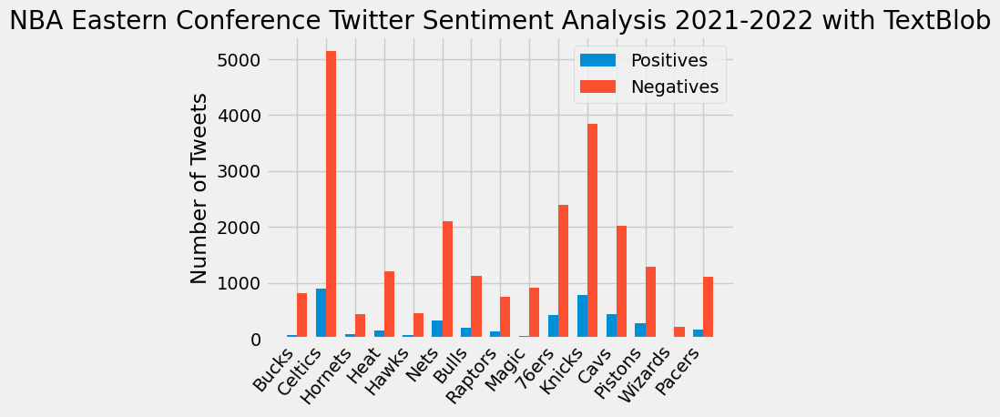

In [194]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.pyplot import figure

figure(figsize=(15, 120), dpi=80)

labels = NBA_East_Conf_Sentiment_Analysis_textblob_df['Eastern Conference Team']
positive = NBA_East_Conf_Sentiment_Analysis_textblob_df['Positives']
negative = NBA_East_Conf_Sentiment_Analysis_textblob_df['Negatives']
#neutral = NBA_East_Conf_Sentiment_Analysis_textblob_df['Neutrals']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, positive, width, label='Positives')
rects2 = ax.bar(x + width/2, negative, width, label='Negatives')
#rects3 = ax.bar(x + width/2, neutral, width, label='Neutrals')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Number of Tweets')
ax.set_title('NBA Eastern Conference Twitter Sentiment Analysis 2021-2022 with TextBlob')
ax.set_xticks(x, labels)
ax.legend()

#ax.bar_label(rects1, padding=3)
#ax.bar_label(rects2, padding=3)
#ax.bar_label(rects3, padding=3)

plt.setp(ax.get_xticklabels(), rotation=50, horizontalalignment='right')

fig.tight_layout()

plt.show()

<Figure size 1200x9600 with 0 Axes>

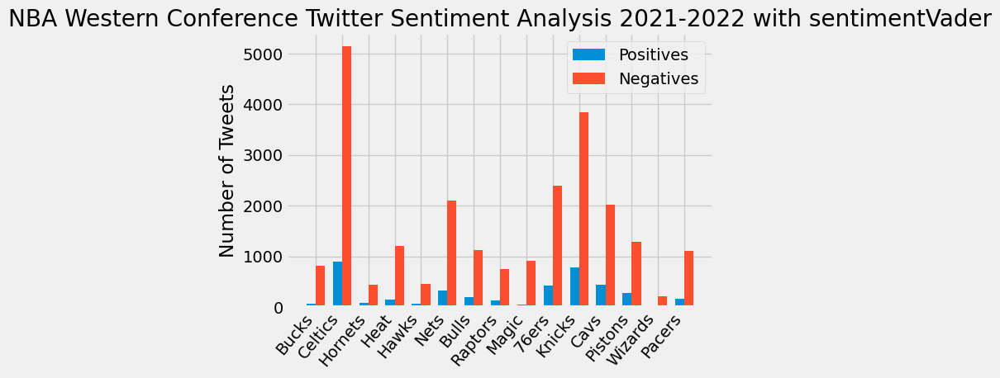

In [197]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.pyplot import figure

figure(figsize=(15, 120), dpi=80)

labels = NBA_East_Conf_Sentiment_Analysis_textblob_df['Eastern Conference Team']
positive = NBA_East_Conf_Sentiment_Analysis_textblob_df['Positives']
negative = NBA_East_Conf_Sentiment_Analysis_textblob_df['Negatives']
#neutral = NBA_East_Conf_Sentiment_Analysis_textblob_df['Neutrals']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, positive, width, label='Positives')
rects2 = ax.bar(x + width/2, negative, width, label='Negatives')
#rects3 = ax.bar(x + width/2, neutral, width, label='Neutrals')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Number of Tweets')
ax.set_title('NBA Western Conference Twitter Sentiment Analysis 2021-2022 with sentimentVader')
ax.set_xticks(x, labels)
ax.legend()

#ax.bar_label(rects1, padding=3)
#ax.bar_label(rects2, padding=3)
#ax.bar_label(rects3, padding=3)

plt.setp(ax.get_xticklabels(), rotation=50, horizontalalignment='right')

fig.tight_layout()

plt.show()